In [ ]:
import rtde_control
import rtde_receive
import numpy as np
import sys
import yaml
from matplotlib import pyplot as plt
import SimpleITK as sitk
import pickle as pkl


import pyrealsense2 as rs
import cv2
import torch

import time
from collections import deque


from force_control import z_force_control

sys.path.append("../../")

from scripts.SurfaceContact.move import move_default_pose

from scripts.SurfaceContact.control import SurfaceContactControl
from scripts.USImageCV.models.unet import UNet
from scripts.USImageCV.utils.bunny import bunny_mask_predict, load_bunny_model,max_connected_area
%load_ext autoreload
%autoreload 2

# To do Dec 6
- 10 pairs of CT and US comparison images.
- Revert plotting direction in CT visualization.
- Wrap probe control functions into a single file.

# Connect to robot

In [2]:
# from recording_upload_server import CaptureServer

rtde_c = rtde_control.RTDEControlInterface("192.168.1.2")
rtde_r = rtde_receive.RTDEReceiveInterface("192.168.1.2")


# Connect to ultrasound image stream

In [20]:
ultrasound_vid = cv2.VideoCapture('/dev/video8')

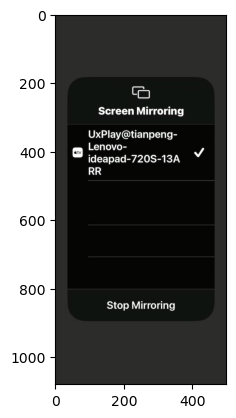

In [21]:

ret, frame = ultrasound_vid.read()		
plt.imshow(frame)

# Load pre-trained bunny segmentation model

In [4]:

device = 'cuda' if torch.cuda.is_available() else 'cpu'

trunk_model = load_bunny_model('../../scripts/USImageCV/model_weights/trunk_seg_model.pth',device)
vessel_model = load_bunny_model('../../scripts/USImageCV/model_weights/vessel_model.pth',device)

# Connect to RGB-D Camera

In [3]:
pipeline = rs.pipeline()
pipeline.start()


# Initialize surface finding controller

In [4]:
with open('../../config/pose_in_TCP_frame.yaml','r') as f:
    poses = yaml.safe_load(f)

    camera_2_tcp = poses['camera']
    probe_2_tcp = poses['probe']
    
body_color_rgb = (99, 55, 34)
body_hsv_rad = (50,50,200)
# rtde_c = rtde_r = []
sc = SurfaceContactControl(pipeline,rtde_c,rtde_r,
                           camera_2_tcp,probe_2_tcp,
                           body_color_rgb,body_hsv_rad)

In [5]:
move_default_pose(rtde_c)

497 306


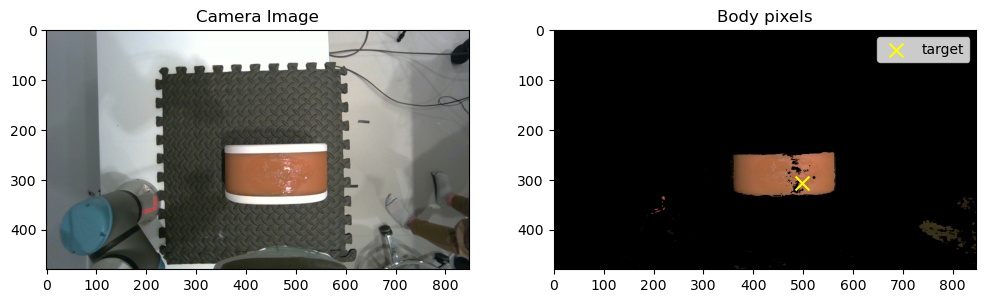

In [15]:
sc.fetchCameraStreamData()
fig = plt.figure(dpi=100,figsize = (12,4))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
sc.showScene([ax1,ax2])


# Utility functions

In [7]:

def find_surface(sc):
    for _ in range(40):
        dist = sc.mainloop()
        dist_threshold = 0.005
        if dist<dist_threshold:
            break
    print("Arrived at above target location. Start descending.")

    sc.loc_normal_control(hover_height=0.20)
    # s = input("Find surface:?")

    if sc.getContact():
        print("Contact made.")

def y_direction_search(model):
    # y direction search has to be very careful, with low speed vel=0.001
    tcp_pose = rtde_r.getActualTCPPose()

    start_pose = rtde_c.poseTrans(tcp_pose,[0,-0.03,0,0,0,0])

    target_pose = rtde_c.poseTrans(tcp_pose,[0,+0.03,0,0,0,0])

    return bunny_view_optim(rtde_c,rtde_r,start_pose,target_pose,
                        ultrasound_vid,
                        model,device,
                        search_vel = 0.001,
                        search_acc = 0.1)

def x_direction_search(model):
    # x direction search can be more crude, with intermediate speed vel=0.01
    tcp_pose = rtde_r.getActualTCPPose()

    start_pose = rtde_c.poseTrans(tcp_pose,[-0.05,0,0,0,0,0])

    target_pose = rtde_c.poseTrans(tcp_pose,[+0.05,0,0,0,0,0])

    return bunny_view_optim(rtde_c,rtde_r,start_pose,target_pose,
                        ultrasound_vid,
                        model,device,
                        search_vel = 0.01,
                        search_acc = 0.1)

def bunny_view_optim(rtde_c,rtde_r,start_pose,target_pose,
                     ultrasound_vid,
                     model,device,
                     search_vel=0.001,
                     search_acc=0.1):
    # Optimize the bunny view by traversing the robot from a start pose to a goal pose.

    # Move the TCP to the starting pose.
    rtde_c.moveL(start_pose,0.01,0.1) 
    
    # After reaching the starting pose, fire off the TCP to move towards the target_pose.
    # Setting asynchoronous=True allows the code to fly forward while the robot execute the motion independently.
    rtde_c.moveL(target_pose,search_vel,search_acc,asynchronous=True) 
    
    # In the asynchorous mode of moveL, we have to actively monitor the robot speed to determine whether the robot has stopped.
    speeds = []
    start_time = time.time()

    time.sleep(0.01) # This will allow the robot to start moving a little
    area_diff = deque(maxlen=3)

    max_area = 0
    optim_pose = []
    frames = []
    for i in range(1000):
        linear_tcp_speed = np.linalg.norm(rtde_r.getActualTCPSpeed()[:3])
        speeds.append(linear_tcp_speed)
        
        ret, frame = ultrasound_vid.read()	
        frames.append(frame)
        ###### Must record the curr_pose right after the image read and before the neural network inference.
        curr_pose = rtde_r.getActualTCPPose()	
        ######


        mask = bunny_mask_predict(model,frame,device)
        area = max_connected_area(mask)
        # print("area",area,"Time elapsed:",time.time()-start_time)
        area_diff.append(area)
        
        if area>max_area:
            max_area = area
            optim_pose = curr_pose
        
        if len(area_diff)>=3 and\
             np.min(area_diff)>4000 and \
                area_diff[-1]-area_diff[-2]<0 and area_diff[-2]-area_diff[-3]<0:
            # If the area starts to consistently decline, stop the robot. 
            # print(list(area_diff))
            rtde_c.stopL() 
            # We can call stopL() to manually stop the robot during execution.
            # This is very useful pairing with the async move of moveL.

            # And move the robot to the optimal pose
            rtde_c.moveL(optim_pose,0.01,0.1)

            return max_area,frames
        
        if linear_tcp_speed<1e-4:
            return max_area,frames
def find_object(detect_model,area_threshold=5000):
    '''
        detect_model: a neural network that detects the pixels of the object to find.
    '''
    max_a = 0
    while True:
        y_direction_search(detect_model)
        
        a,_ = x_direction_search(detect_model)
        print('Max area',a)
        if a>=max_a:
            max_a = a
        if max_a>=area_threshold:
            break


def centralize_object(model):
    '''
        model: the neural network responsible for outputing the segmentation mask of the desired object.
    '''
    for i in range(20):
        ret, frame = ultrasound_vid.read()	
        mask = bunny_mask_predict(model,frame,device)
        z_c,x_c=np.mean(np.argwhere(mask),axis=0)

        # We have ensured that the x axis of TCP aligns with axis 1 of frame, and z axis of TCP aligns with axis[0] of frame.
        x_dir = x_c-frame.shape[1]//2
        print("Centralizing the object. Pixel distance remaining: ",np.linalg.norm(x_dir))

        if np.linalg.norm(x_dir)<20:
            break

        tcp_pose = rtde_r.getActualTCPPose()

        move_step = 1/100
        target_pose = rtde_c.poseTrans(tcp_pose,[move_step*np.sign(x_dir),0,0,0,0,0])


        rtde_c.moveL(target_pose,0.005,0.1)
    

def record_registration(record_model,n_samples):
    start_pose = rtde_r.getActualTCPPose()
    frames = []
    poses = []
    
    # Move and record in the feet direction
    target_pose = rtde_c.poseTrans(start_pose,[0,-0.03,0,0,0,0])
    f,p = record_registration_frames(rtde_c,rtde_r,start_pose,target_pose,
                        ultrasound_vid,
                        record_model,device,
                        n_waypoints = n_samples//2)
    
    # Make sure the order is from feet towards head
    f.reverse()
    p.reverse()

    frames+=f
    poses+=p
    # Move and record in the head direction
    target_pose = rtde_c.poseTrans(start_pose,[0,0.03,0,0,0,0])
    f,p = record_registration_frames(rtde_c,rtde_r,start_pose,target_pose,
                        ultrasound_vid,
                        record_model,device,
                        n_waypoints = n_samples//2)
    frames+=f
    poses+=p
    return frames,poses
def record_registration_frames(rtde_c,rtde_r,start_pose,target_pose,
                     ultrasound_vid,
                     model,device,
                    n_waypoints = 50):

    start_loc = start_pose[:3]
    target_loc = target_pose[:3]
    waypoints = np.linspace(start_loc,target_loc,n_waypoints)
    waypoints = [list(w)+start_pose[3:] for w in waypoints]

    rtde_c.moveL(start_pose,0.01,0.1)
    # y direction search has to be very careful, with low speed vel=0.001
    tcp_pose = rtde_r.getActualTCPPose()
    start_pose = tcp_pose

    # In the asynchorous mode of moveL, we have to actively monitor the robot speed to determine whether the robot has stopped.
    speeds = []
    start_time = time.time()

    time.sleep(0.01) # This will allow the robot to start moving a little
    n_hist = 5
    areas = deque(maxlen=n_hist)

    poses=[]
    frames = []
    for w in waypoints:
        
        ret, frame = ultrasound_vid.read()
        frames.append(frame)
        ###### Must record the curr_pose right after the image read and before the neural network inference.
        curr_pose = rtde_r.getActualTCPPose()	
        poses.append(curr_pose)
        ######
        mask = bunny_mask_predict(model,frame,device)
        area = max_connected_area(mask)
        print("area",area,"Time elapsed:",time.time()-start_time)
        areas.append(area)
        if len(areas)>=n_hist and np.max(areas)<=2000:
            # If the area starts to consistently be small, stop the robot.
            # And move the robot to the start pose
            break
        rtde_c.moveL(w,0.01,0.1)
    rtde_c.moveL(start_pose,0.01,0.1)
    return frames,poses

In [19]:
# Start the control pipeline
move_default_pose(rtde_c)

RTDEReceiveInterface Exception: Operation canceled
RTDEControlInterface: Could not receive data from robot...
RTDEControlInterface Exception: Operation canceled
RTDEControlInterface: Robot is disconnected, reconnecting...


Reconnecting...


RTDEControlInterface Exception: Timeout connecting to UR dashboard server.


Dashboard client deadline expired


In [18]:
# Start the control pipeline
move_default_pose(rtde_c)
w0 = rtde_r.getActualTCPForce()# Record force zero

find_surface(sc)

target_force = 22
force_err_tolerance = 0.2
z_force_control(target_force,rtde_r,rtde_c,w0)

Arrived at above target location. Start descending.
Contact made.


Current force is:21.67389210907121:  Time elapsed=00:12 

Target force reached.


True

In [32]:
find_object(trunk_model)
centralize_object(trunk_model)

f,p = record_registration(vessel_model,n_samples=80)

with open('registration_3d_frames.pkl','wb') as fp:
    pkl.dump({'frames':f,'waypoints':p},fp)

Max area 6264.0
Centralizing the object. Pixel distance remaining:  75.51961267027735
Centralizing the object. Pixel distance remaining:  45.50390041493773
Centralizing the object. Pixel distance remaining:  9.938696125719616
area 5884.0 Time elapsed: 0.47929954528808594
area 5776.0 Time elapsed: 0.9573085308074951
area 5812.0 Time elapsed: 1.619255781173706
area 5664.0 Time elapsed: 2.2604475021362305
area 5217.0 Time elapsed: 2.922706365585327
area 4861.0 Time elapsed: 3.5546650886535645
area 4378.0 Time elapsed: 4.244098901748657
area 3882.0 Time elapsed: 4.8856201171875
area 3718.0 Time elapsed: 5.523545265197754
area 3482.0 Time elapsed: 6.167444229125977
area 3370.0 Time elapsed: 6.785302400588989
area 3203.0 Time elapsed: 7.417242527008057
area 3187.0 Time elapsed: 8.055057287216187
area 3525.0 Time elapsed: 8.677748918533325
area 3605.0 Time elapsed: 9.360766410827637
area 3256.0 Time elapsed: 9.922136306762695
area 3201.0 Time elapsed: 10.527903318405151
area 3333.0 Time elaps

In [33]:

with open('registration_3d_frames.pkl','rb') as fp:
    reg_data = pkl.load(fp)

frames,waypoints = reg_data['frames'],reg_data['waypoints']

masks = []
for frame in frames:
    masks.append(bunny_mask_predict(vessel_model,frame,device))
masks = np.array(masks)

# Get rid of the noisy predictions in the image. Only save the maximal connected component
_,masks = max_connected_area(masks,return_mask=True)

vessel_us = sitk.GetImageFromArray(masks)
with open('../../config/us_spacing.yaml') as fp:
    sp = yaml.safe_load(fp)

# Spacing Units are mm.
xspacing = sp['xspacing'] 
yspacing = sp['yspacing']
start_loc = np.array(waypoints[0][:3])
end_loc = np.array(waypoints[-1][:3])
zspacing = 1000*np.linalg.norm(start_loc-end_loc)/len(f)

vessel_us.SetSpacing((xspacing,yspacing,zspacing))

# Save checkpoint for registration
sitk.WriteImage(vessel_us,'vessel_us.nii.gz')

# 3D Registration between US and CT

In [34]:
from scripts.Registration3D.registration import central_normalize_img, calculate_ct2us_transform
def flip_img(input_img,orders):
    flipped_ct = sitk.Flip(input_img,orders)
    flipped_ct = sitk.GetImageFromArray(sitk.GetArrayFromImage(flipped_ct).astype(np.float64))
    flipped_ct.SetOrigin(input_img.GetOrigin())
    flipped_ct.SetSpacing(input_img.GetSpacing())
    return flipped_ct

In [35]:


original_vessel_ct = sitk.ReadImage('vessel_ct.nii.gz')
# The left-right order is different between the US image and CT image. We flip vessel_ct to make them consistent.
original_vessel_ct = flip_img(original_vessel_ct,[True,False,False])
vessel_ct = central_normalize_img(original_vessel_ct,150)



original_vessel_us = sitk.ReadImage('vessel_us.nii.gz')
vessel_us = central_normalize_img(original_vessel_us,150)

CT2US = calculate_ct2us_transform(vessel_us,vessel_ct)

Start optimizing the transformation


100%|██████████| 10/10 [00:28<00:00,  2.88s/it]


# Visualize registration result

In [ ]:

import pickle as pkl
from cv2 import cvtColor

def to_grayscale(img):
    original_shape = img.shape[:2]
    img = cvtColor(img,cv2.COLOR_BGR2GRAY).astype(float)
    img /= np.max(img)
    return img
body_ct = sitk.ReadImage('CT_phantom_regular.nii.gz')
body_ct = flip_img(body_ct,[True,False,False])


with open('registration_3d_frames.pkl','rb') as fp:
    data = pkl.load(fp)
    
frames,waypoints = data['frames'], data['waypoints']
for i in range(len(frames)):
    frames[i] = to_grayscale(frames[i])
body_us = sitk.GetImageFromArray(frames)

# Select a list of locations in CT and move the robots to go to them

1.0 0.0


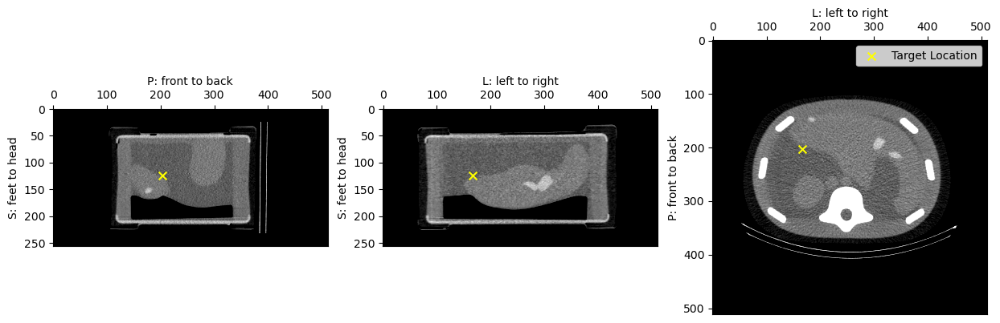

Ultrasound
1.0 0.0


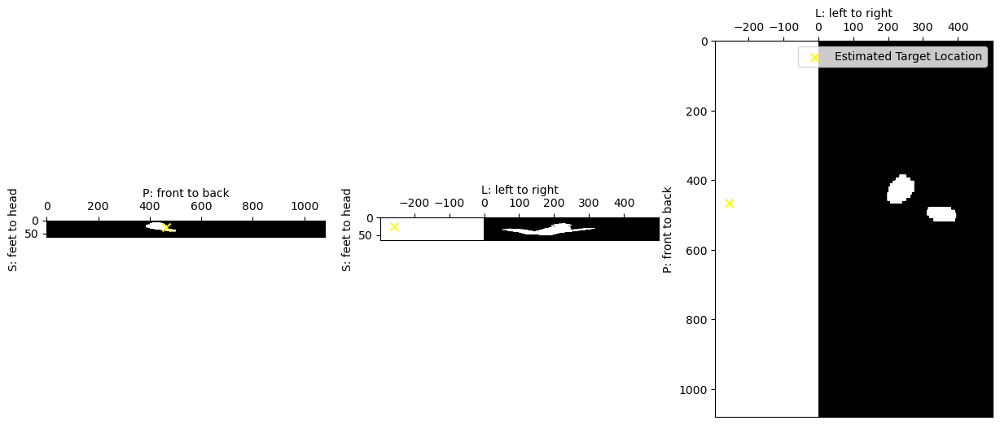

1.0 0.0


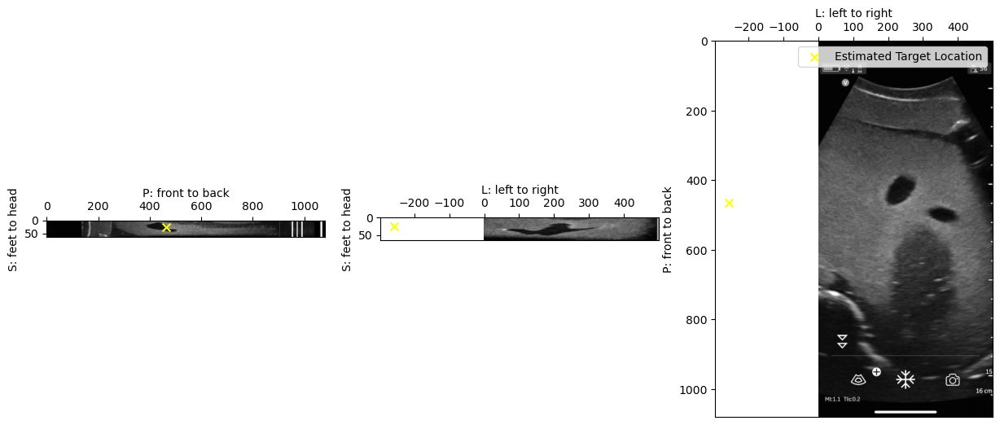

1.0 0.0


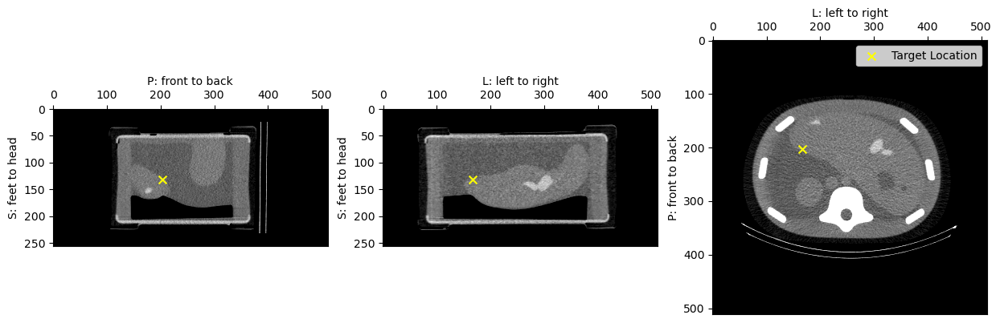

Ultrasound
1.0 0.0


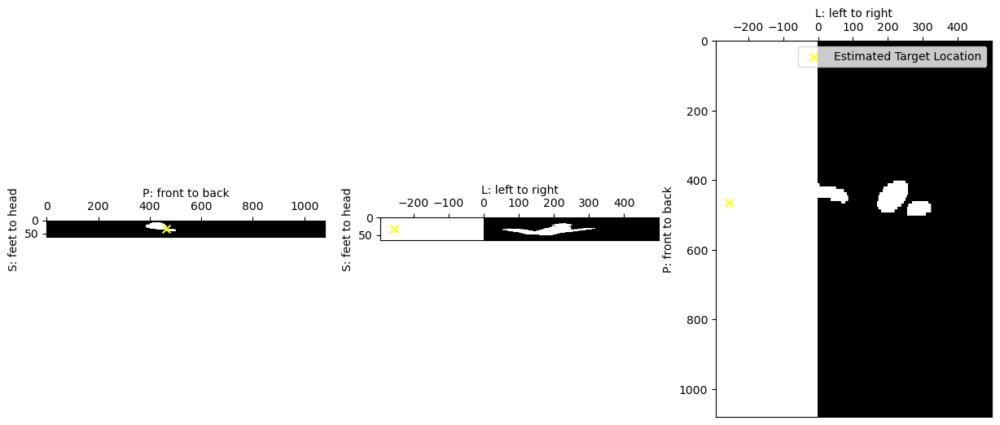

1.0 0.0


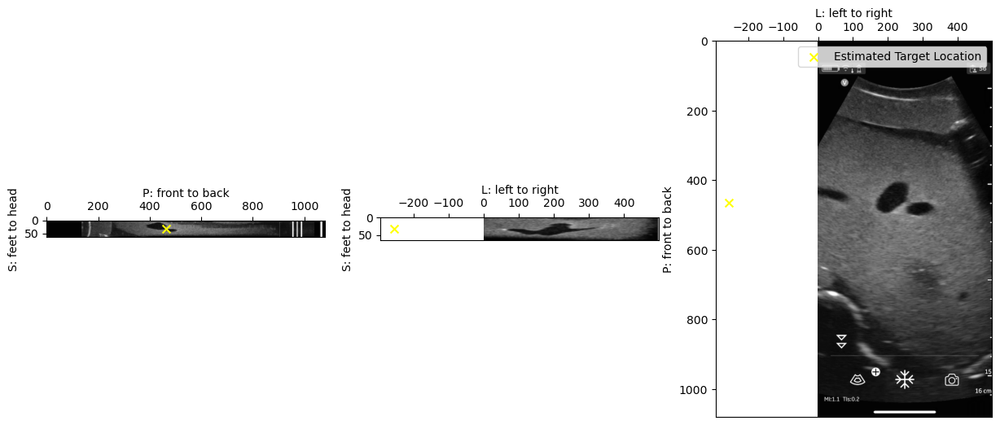

1.0 0.0


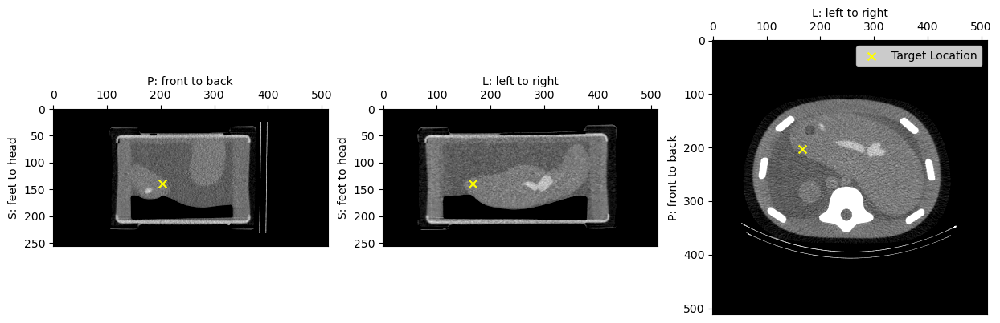

Ultrasound
1.0 0.0


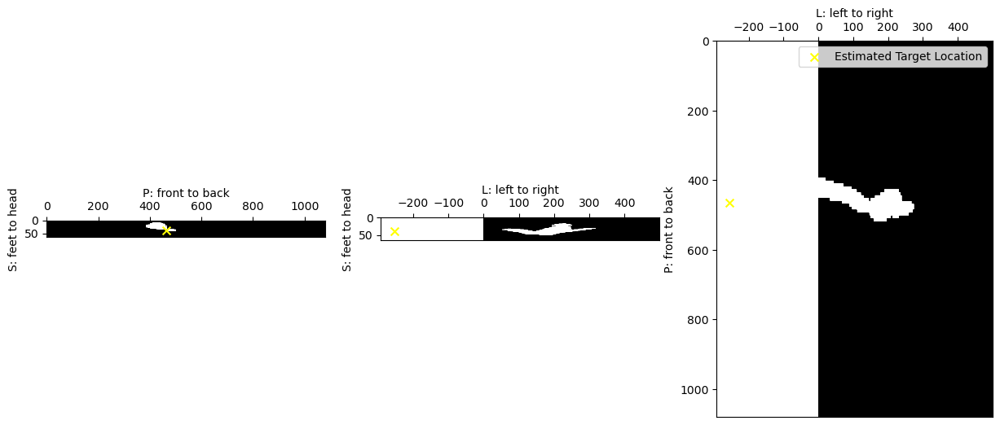

1.0 0.0


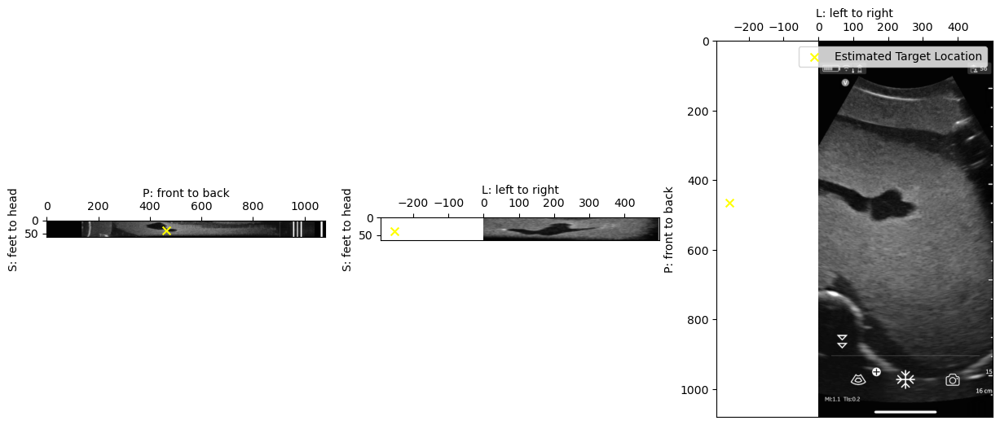

1.0 0.0


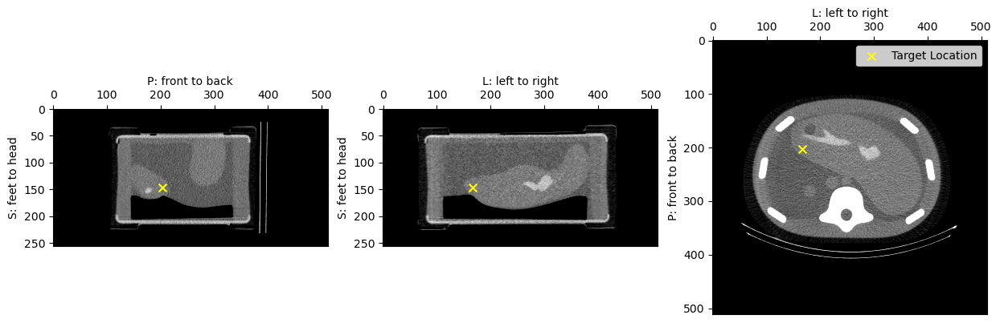

Ultrasound
1.0 0.0


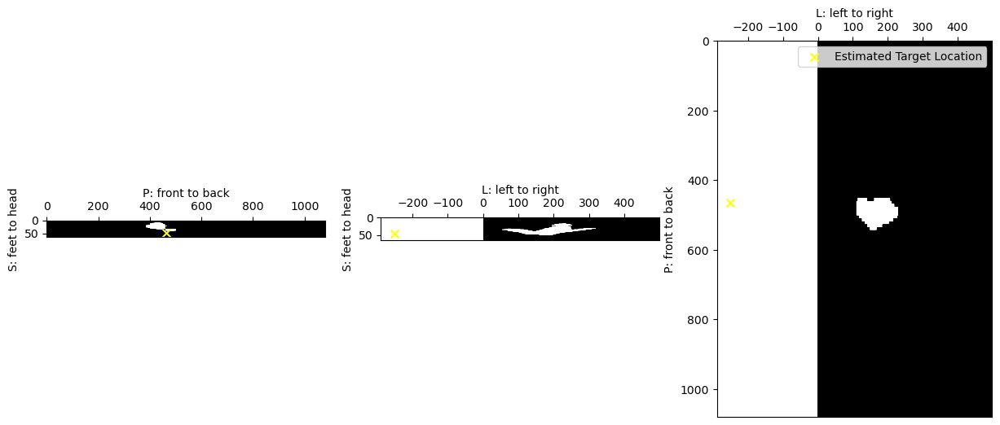

1.0 0.0


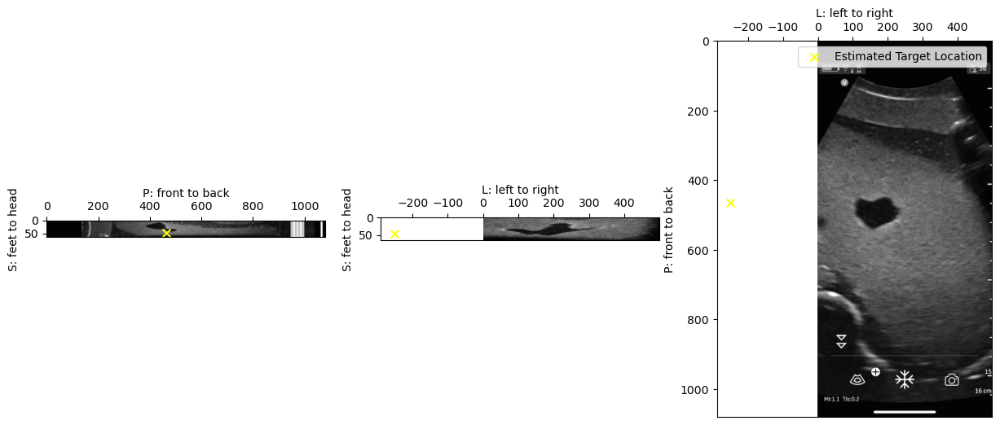

1.0 0.0


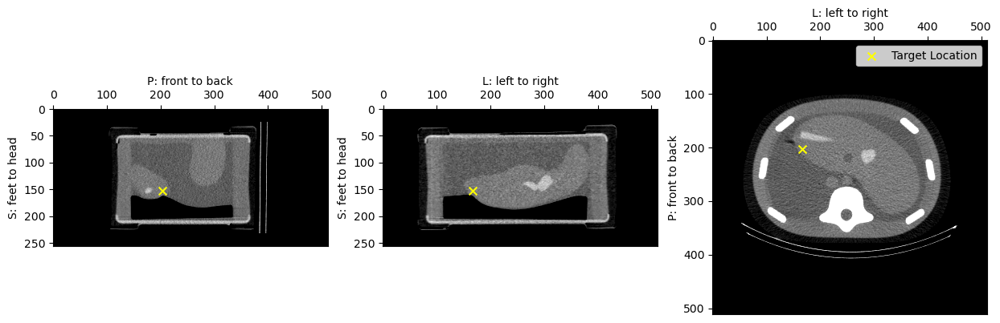

Ultrasound
1.0 0.0


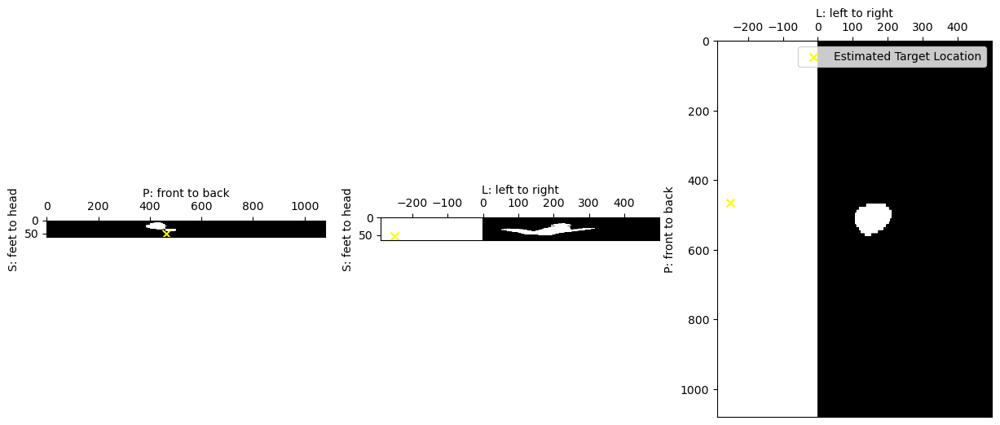

1.0 0.0


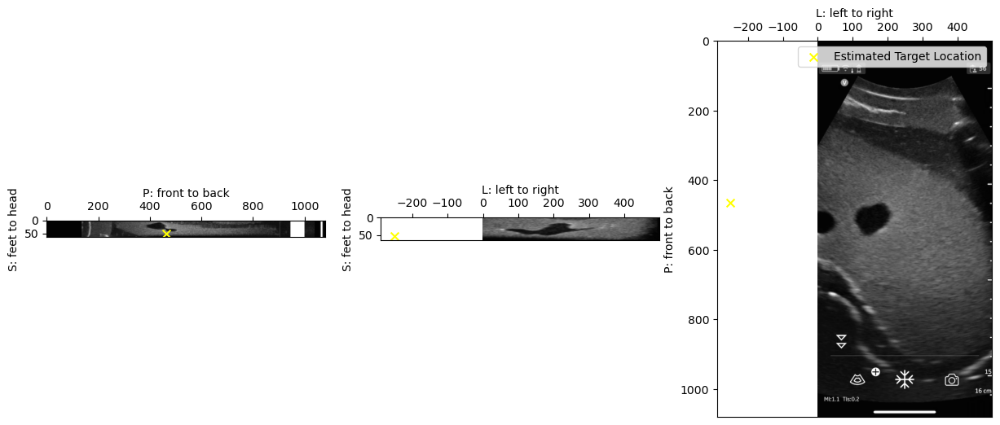

1.0 0.0


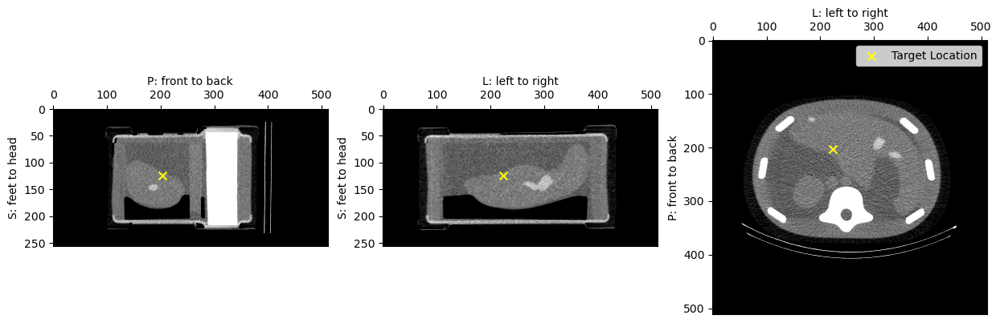

Ultrasound
1.0 0.0


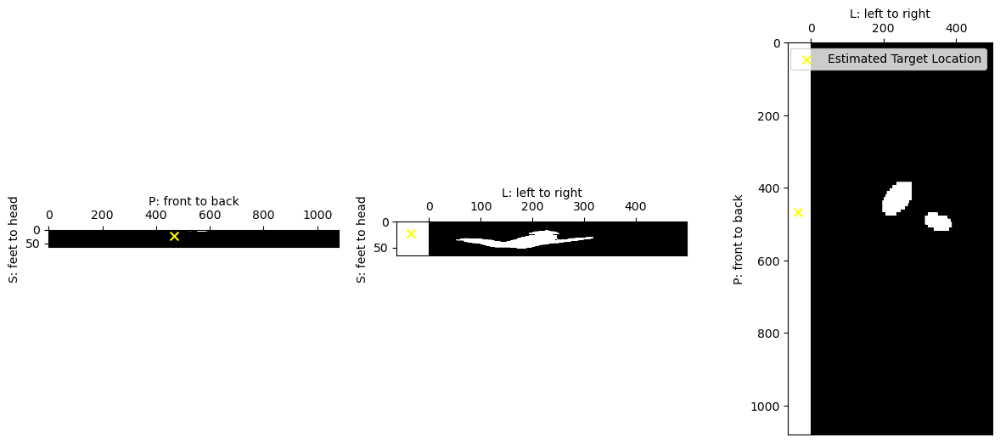

1.0 0.0


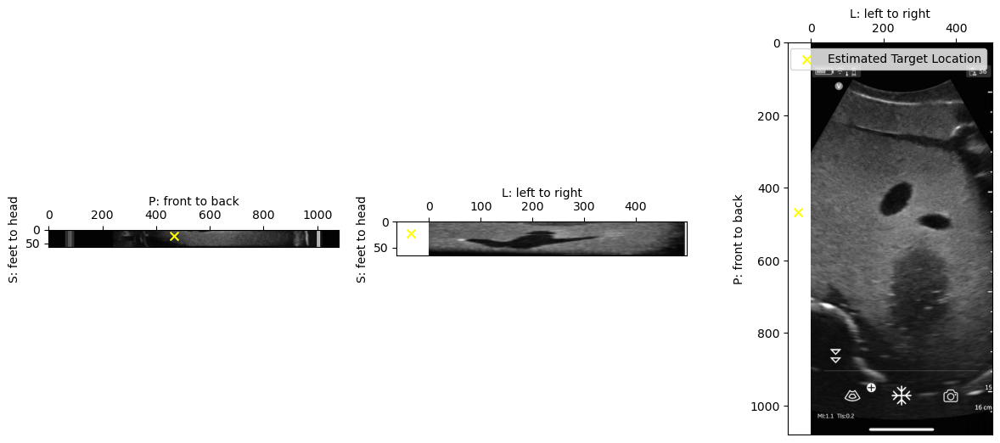

1.0 0.0


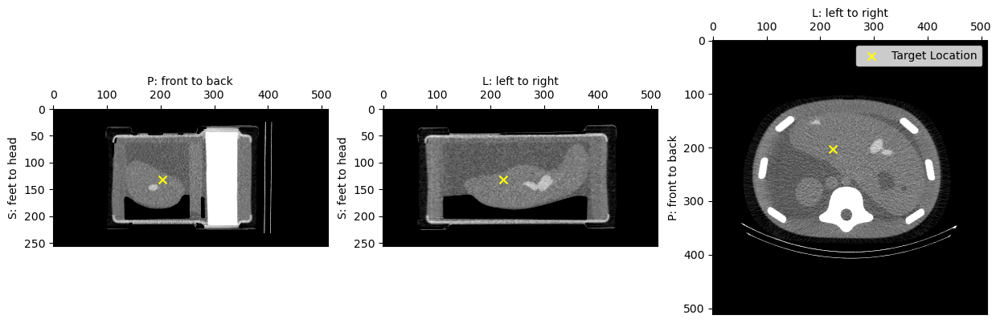

Ultrasound
1.0 0.0


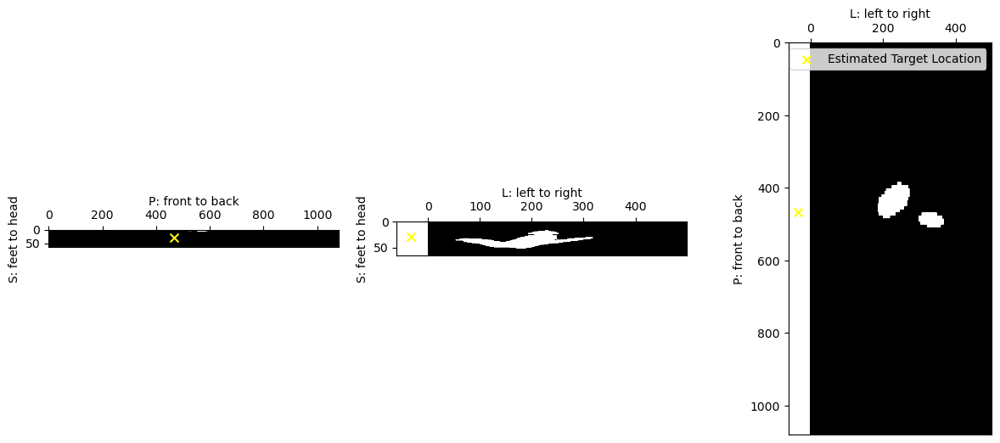

1.0 0.0


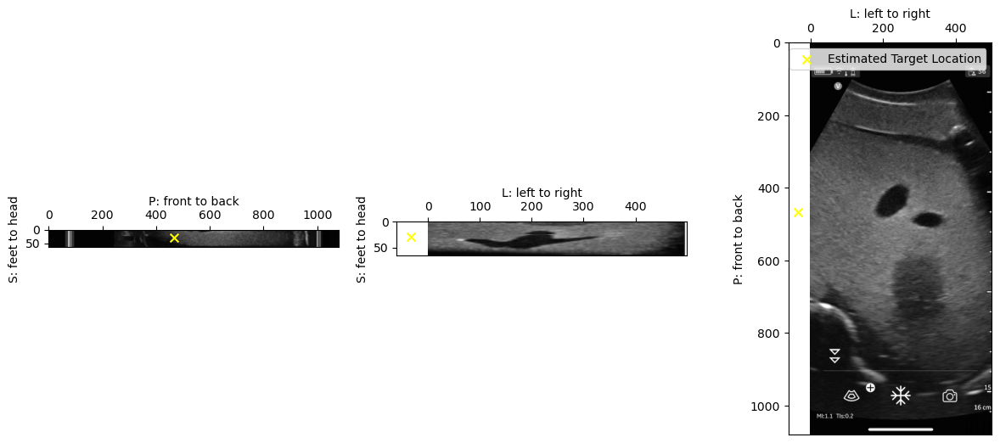

1.0 0.0


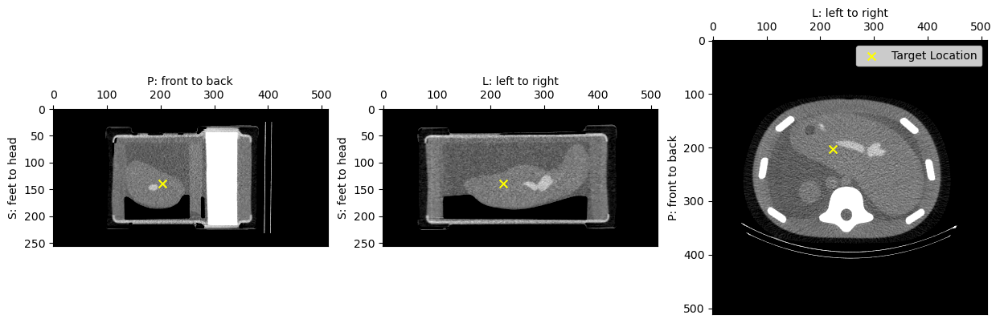

Ultrasound
1.0 0.0


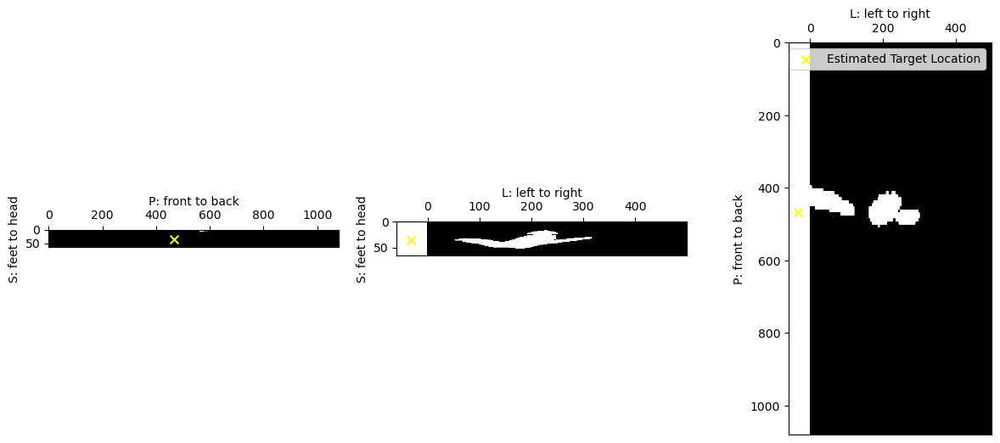

1.0 0.0


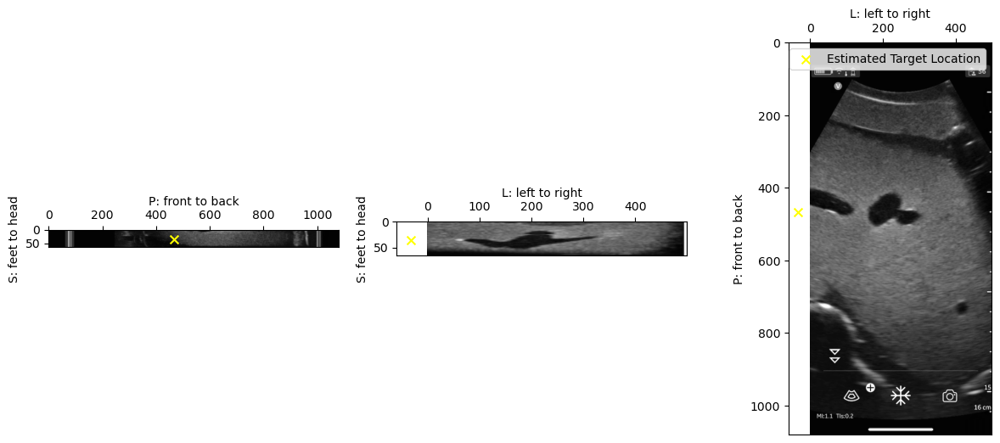

1.0 0.0


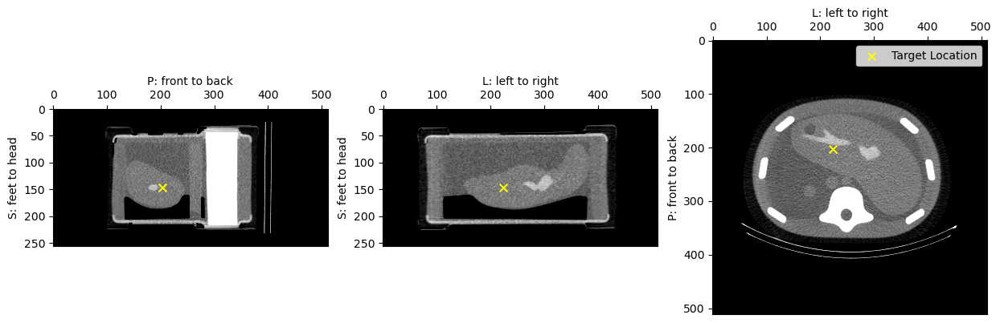

Ultrasound
1.0 0.0


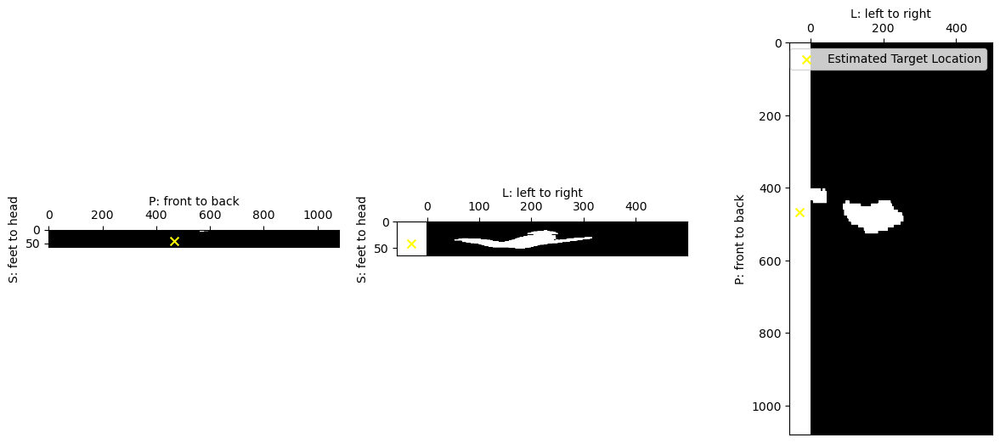

1.0 0.0


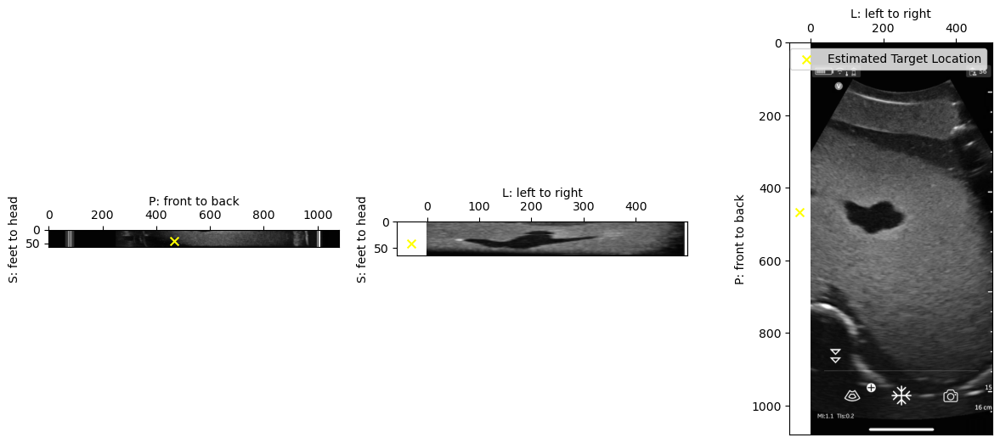

1.0 0.0


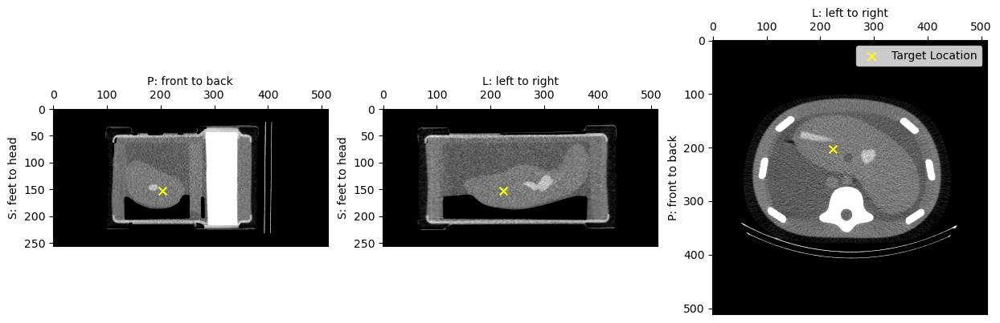

Ultrasound
1.0 0.0


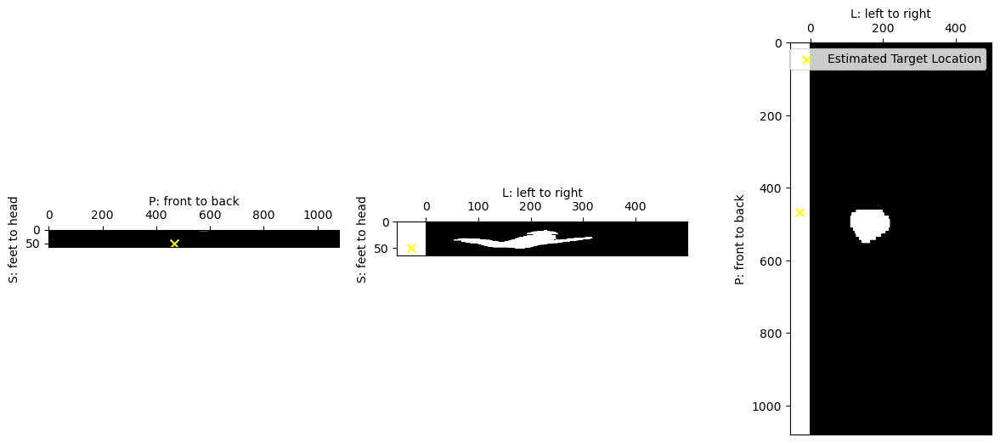

1.0 0.0


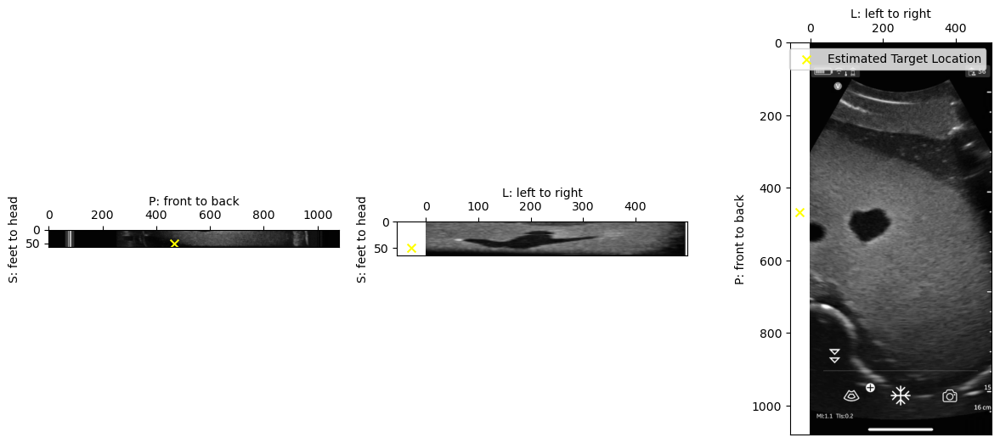

1.0 0.0


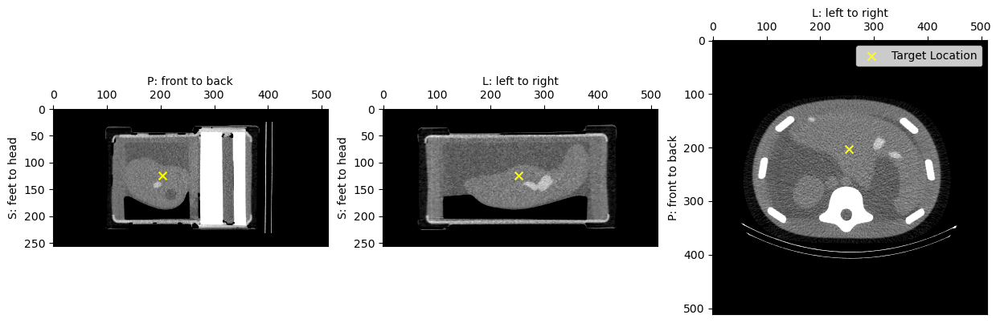

Ultrasound
1.0 0.0


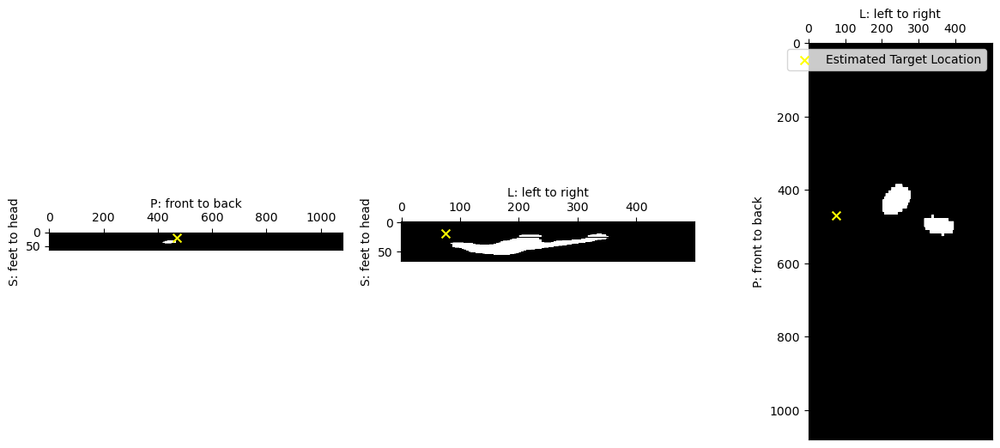

1.0 0.0


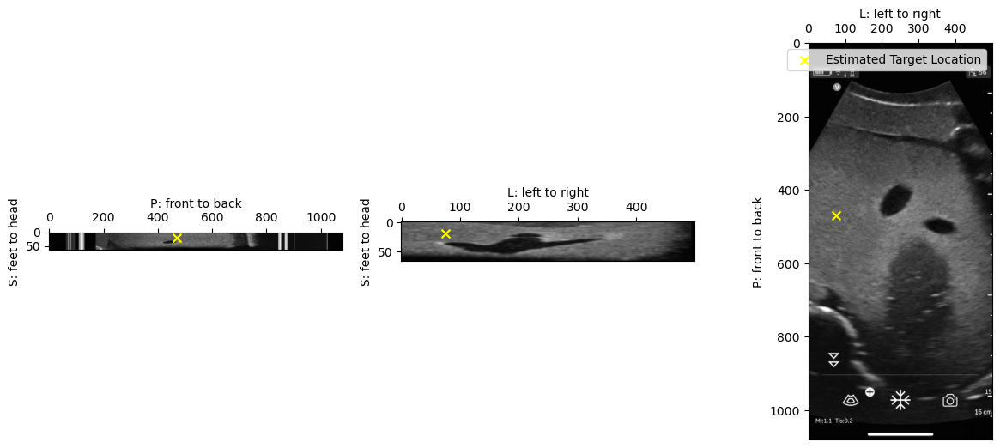

1.0 0.0


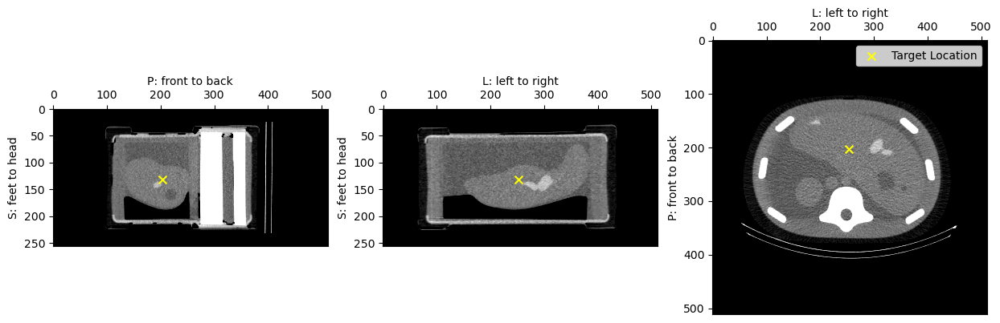

Ultrasound
1.0 0.0


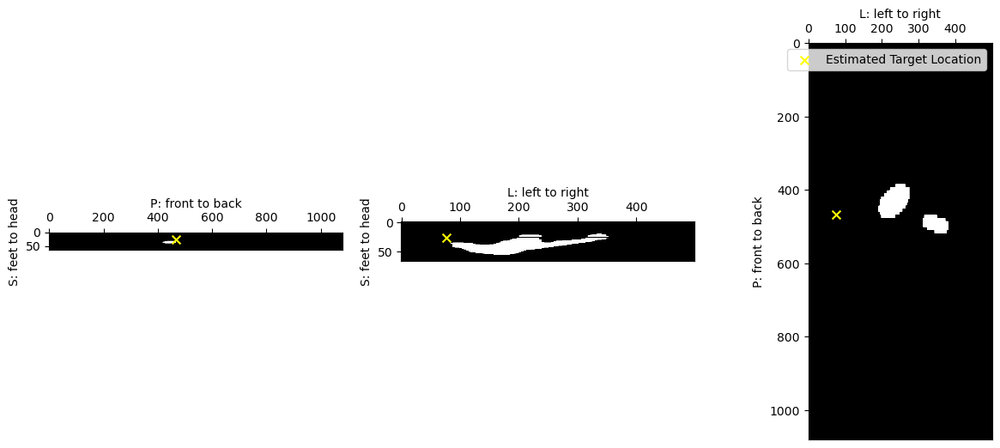

1.0 0.0


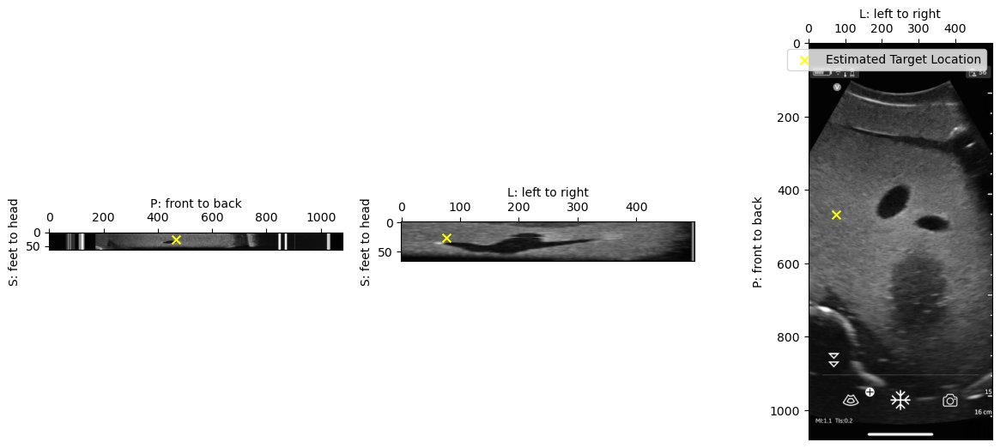

1.0 0.0


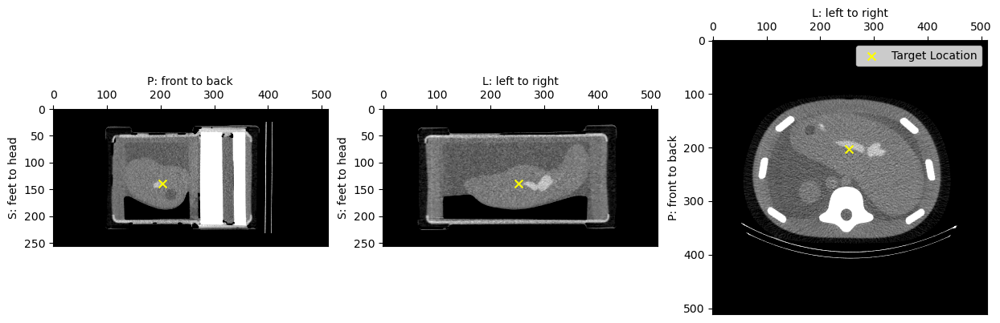

Ultrasound
1.0 0.0


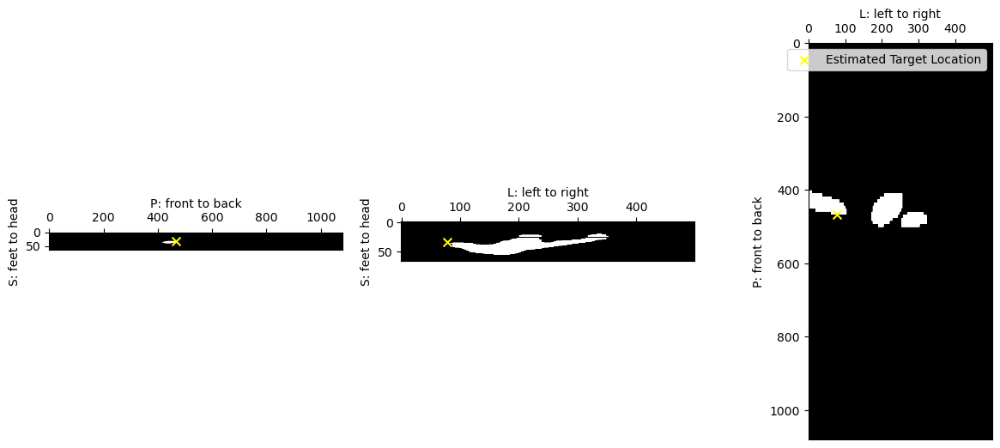

1.0 0.0


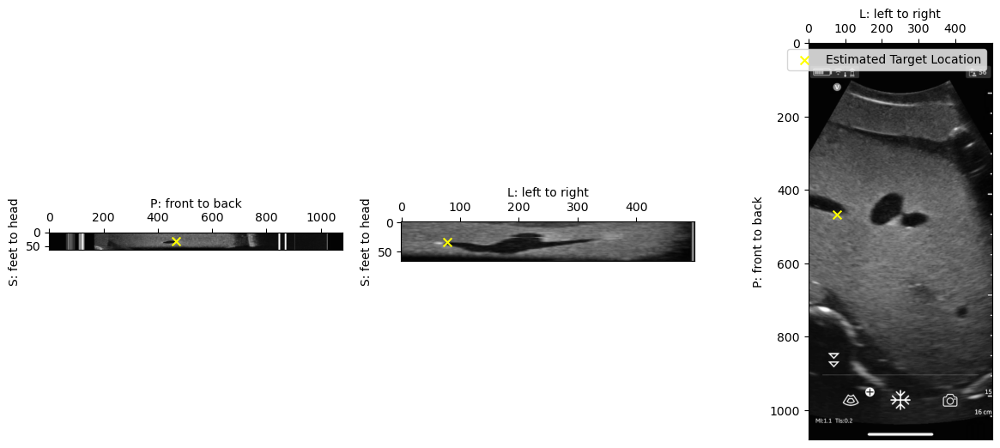

1.0 0.0


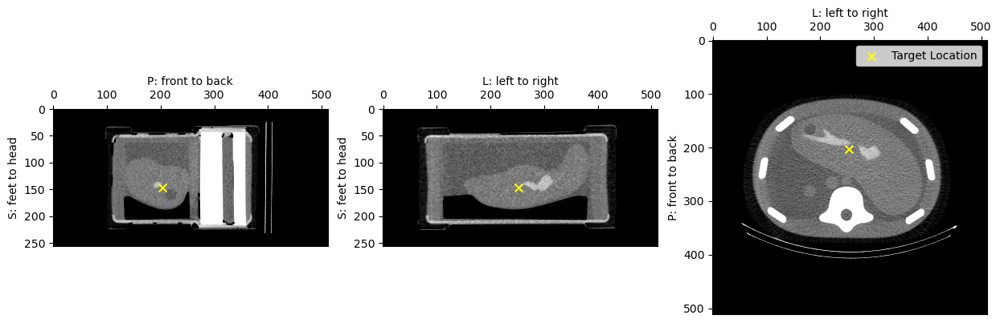

Ultrasound
1.0 0.0


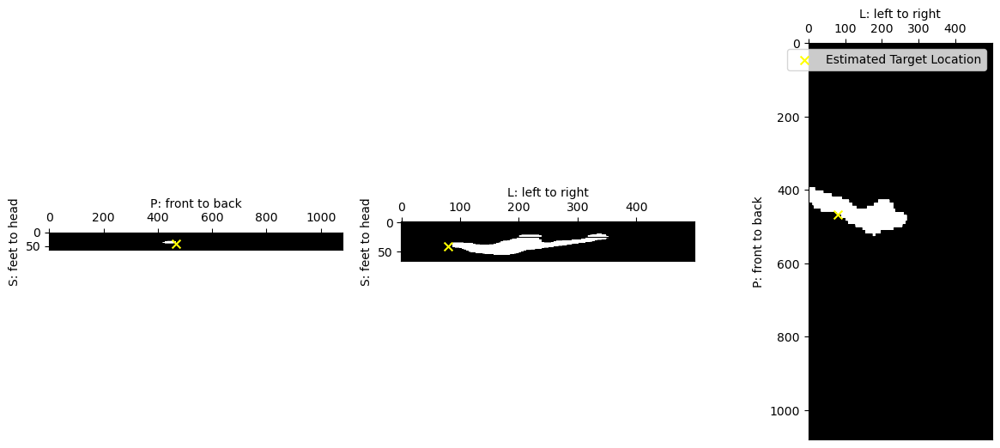

1.0 0.0


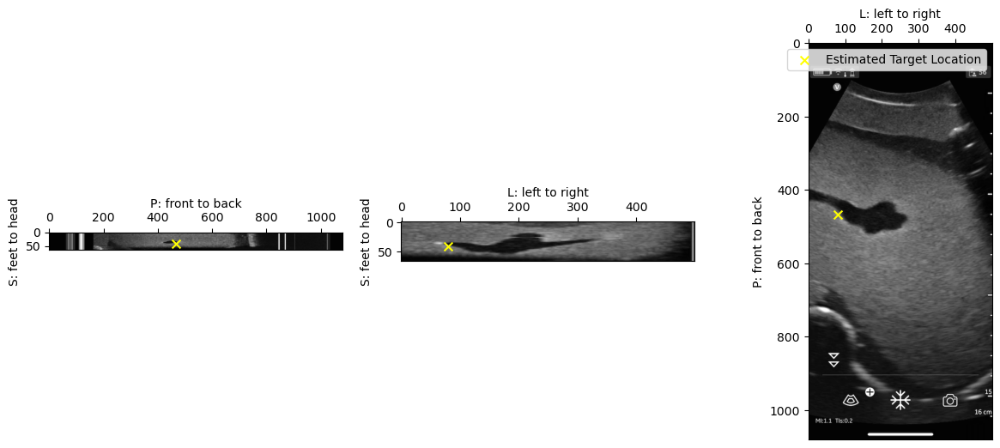

1.0 0.0


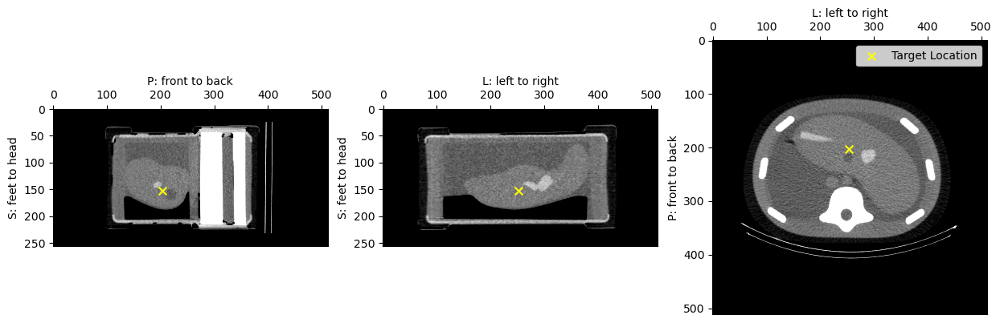

Ultrasound
1.0 0.0


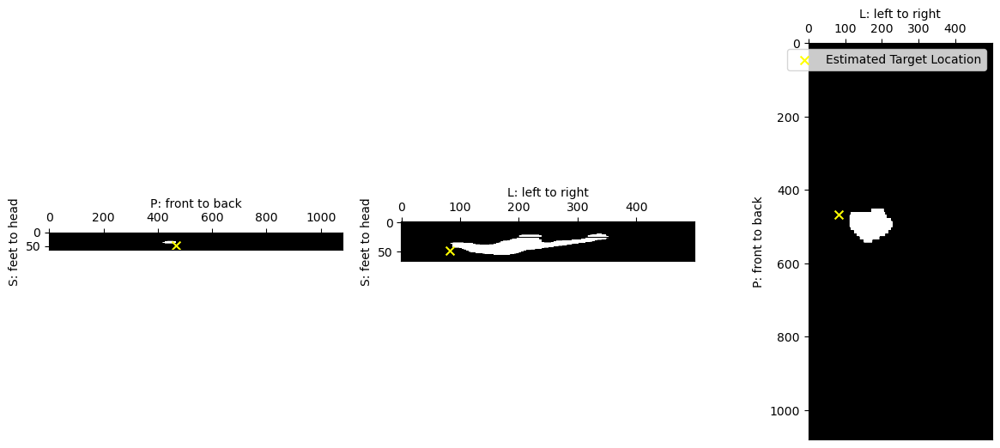

1.0 0.0


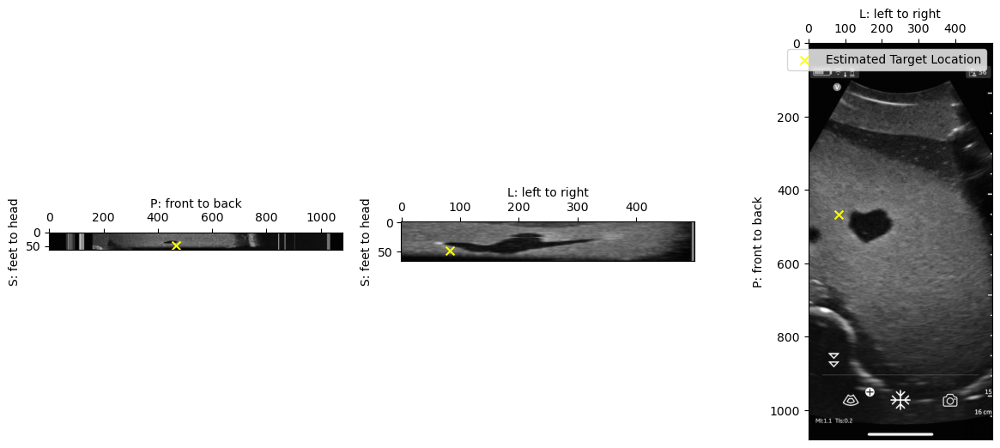

1.0 0.0


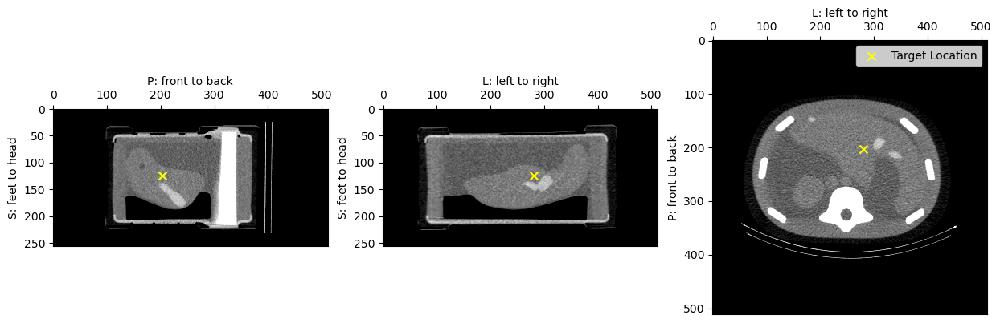

Ultrasound
1.0 0.0


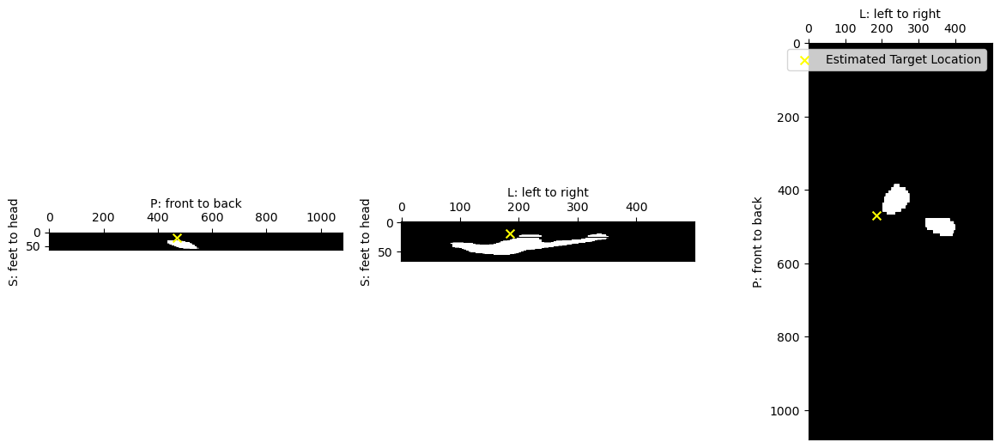

1.0 0.0


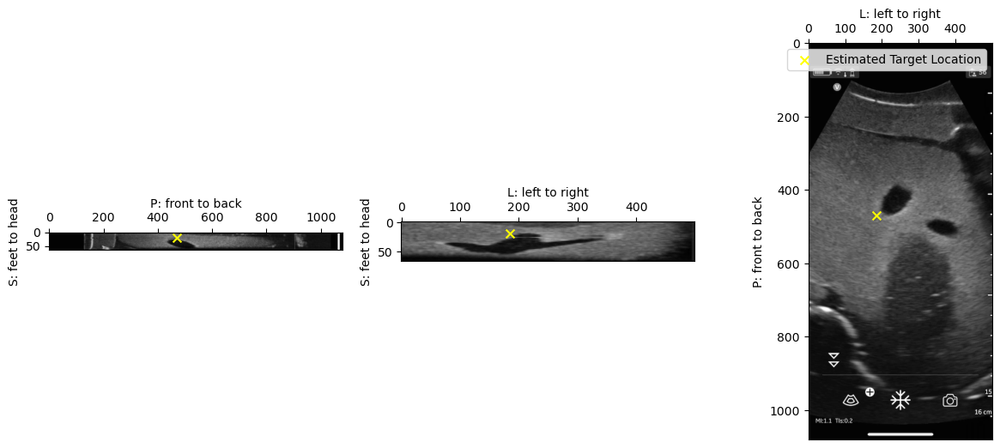

1.0 0.0


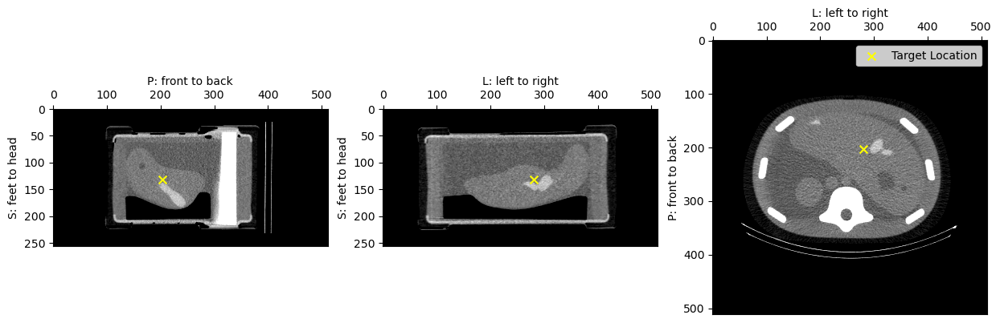

Ultrasound
1.0 0.0


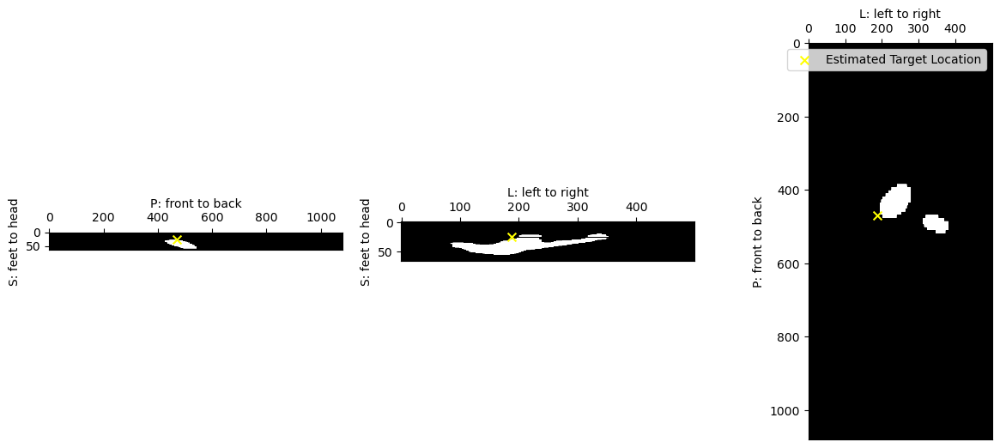

1.0 0.0


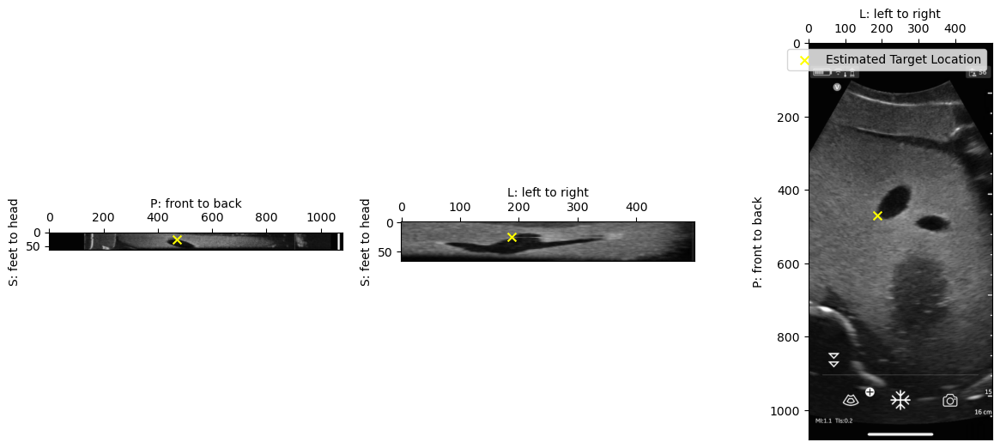

1.0 0.0


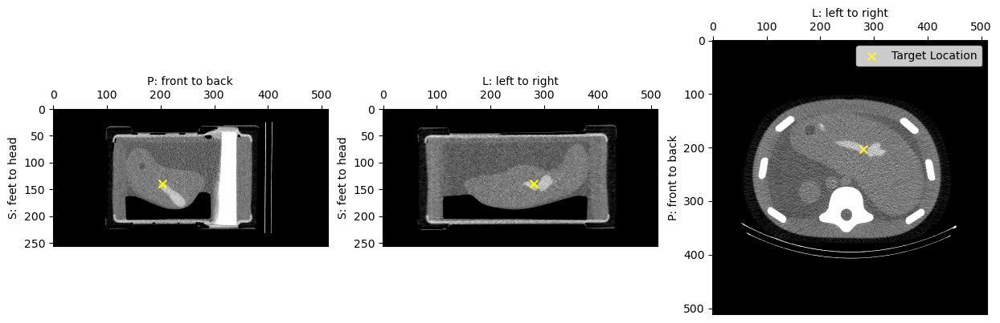

Ultrasound
1.0 0.0


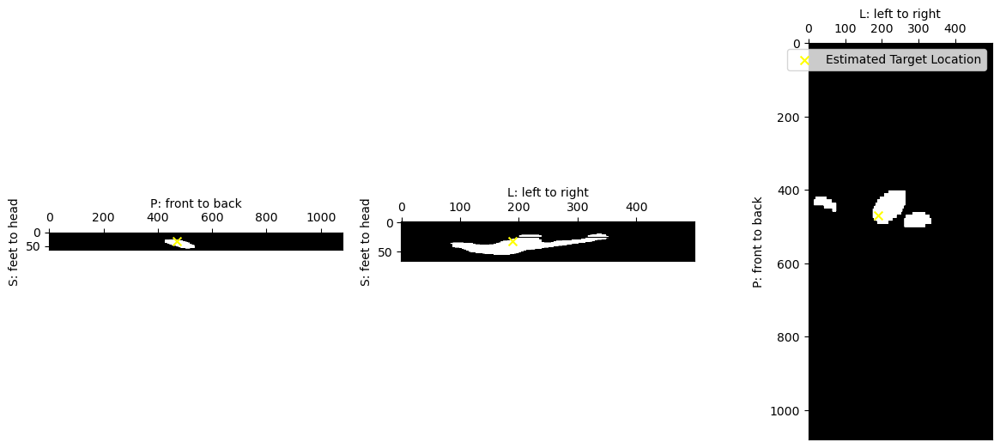

1.0 0.0


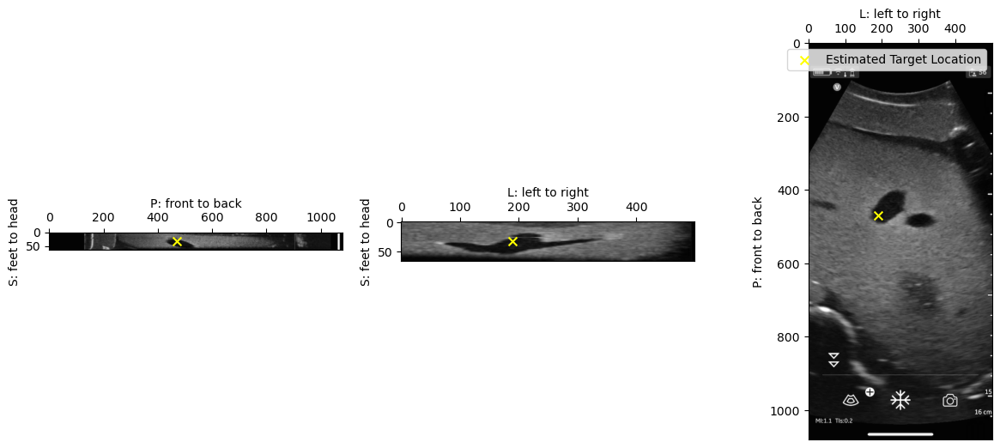

1.0 0.0


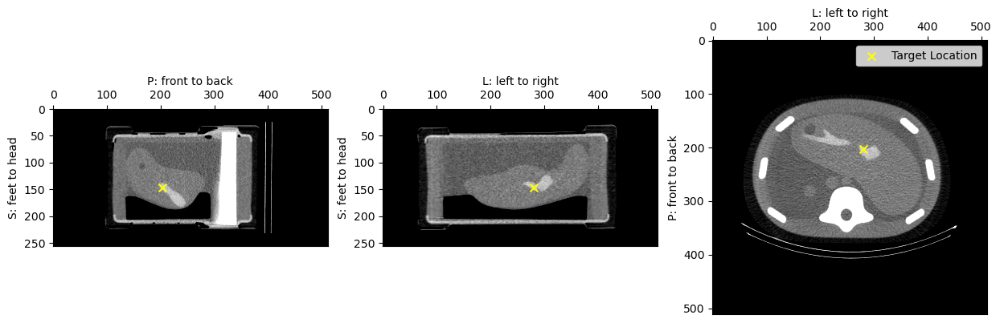

Ultrasound
1.0 0.0


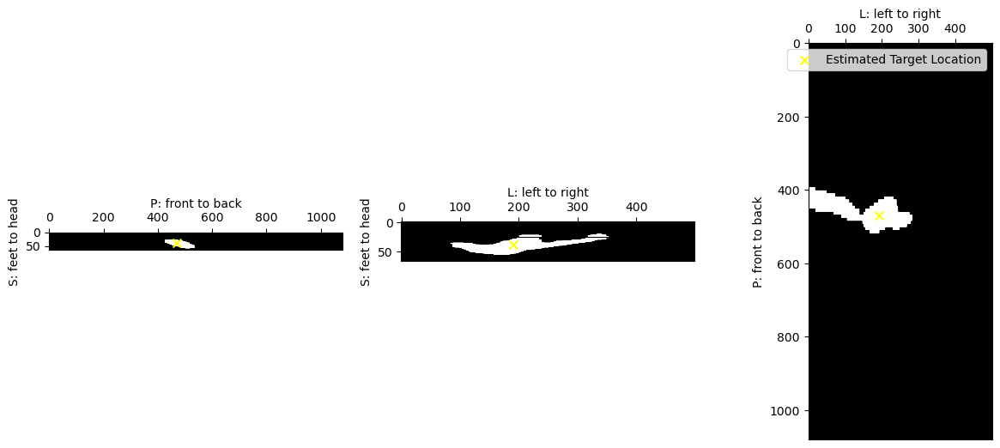

1.0 0.0


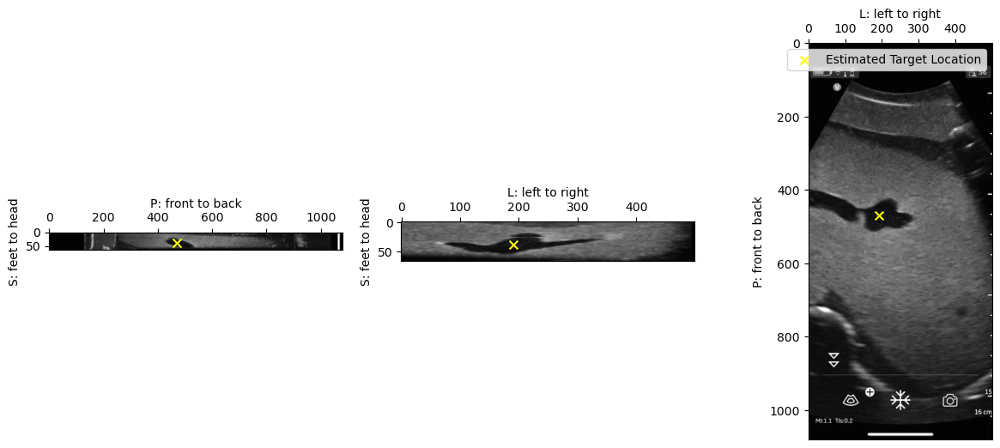

1.0 0.0


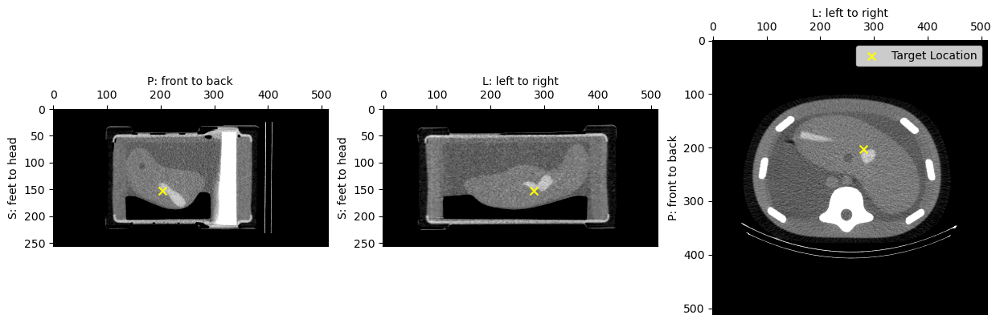

Ultrasound
1.0 0.0


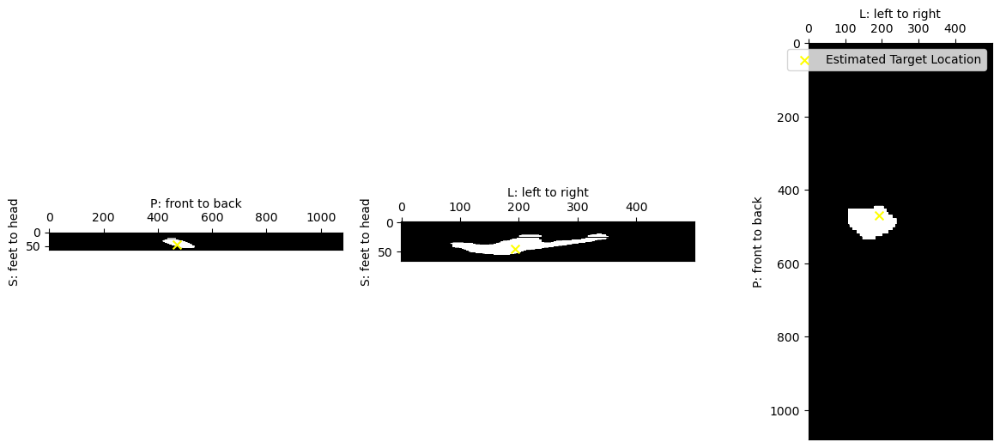

1.0 0.0


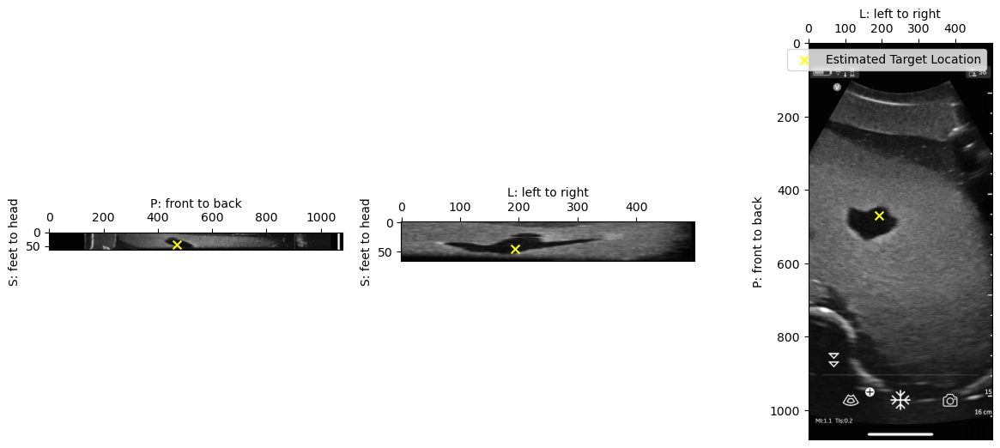

1.0 0.0


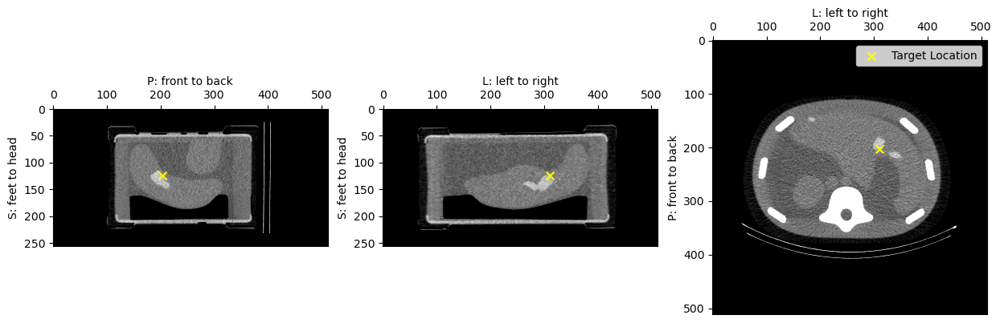

Ultrasound
1.0 0.0


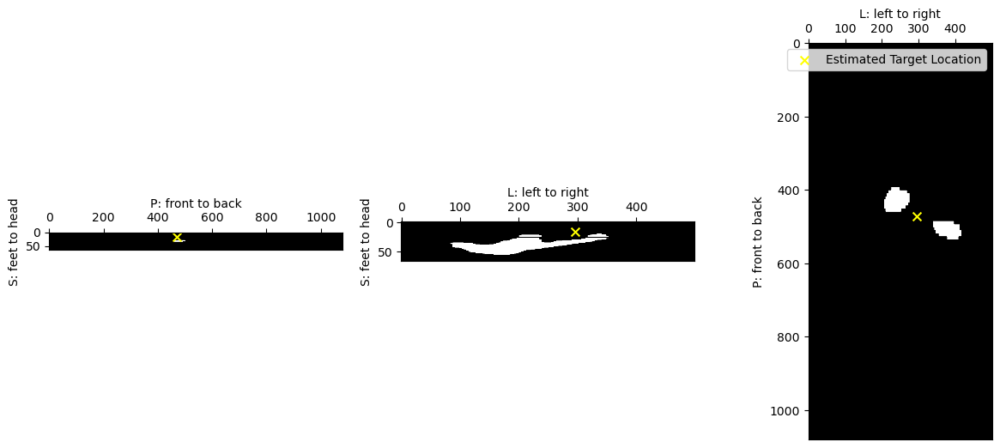

1.0 0.0


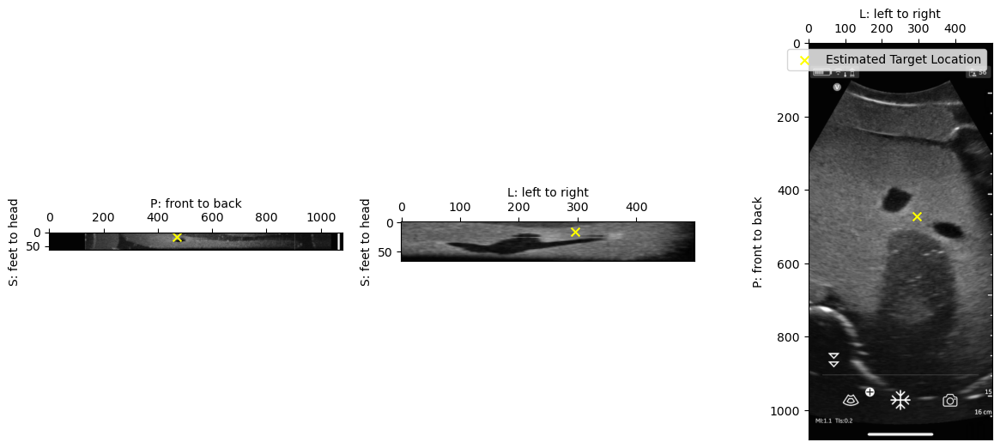

1.0 0.0


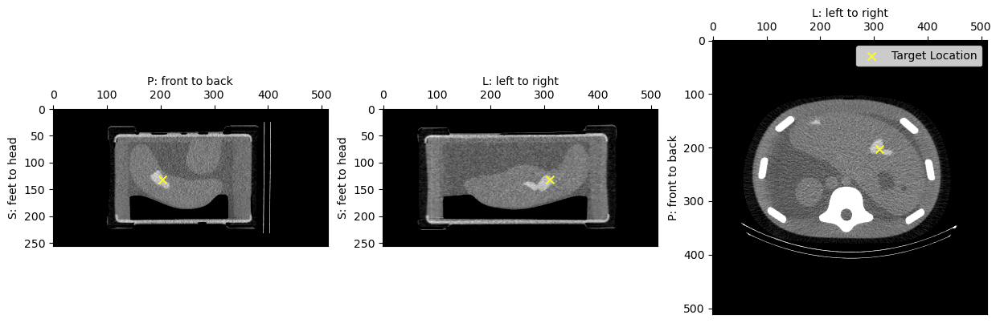

Ultrasound
1.0 0.0


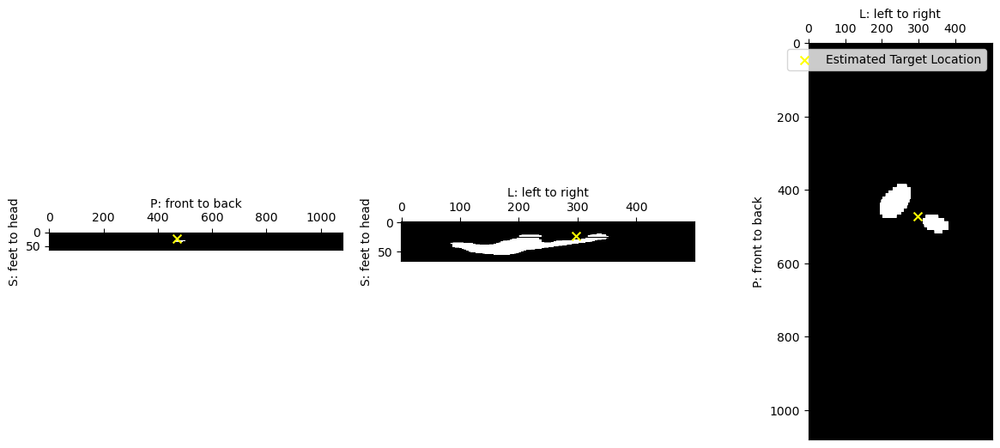

1.0 0.0


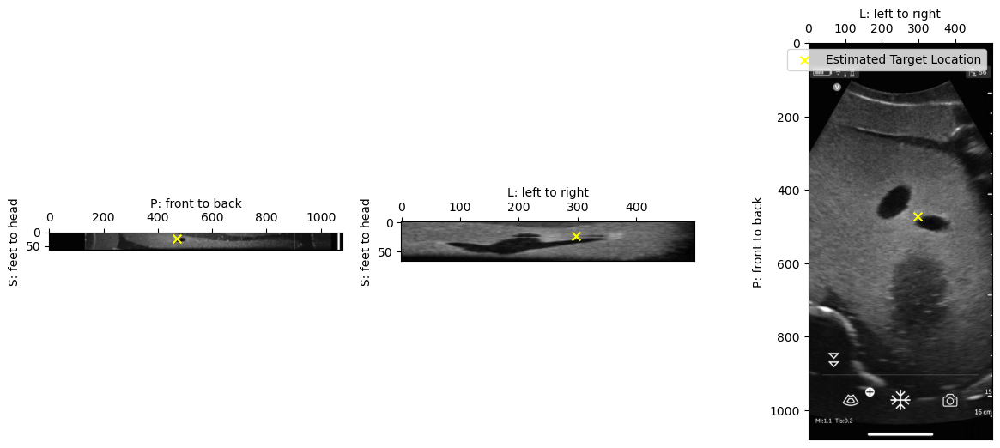

1.0 0.0


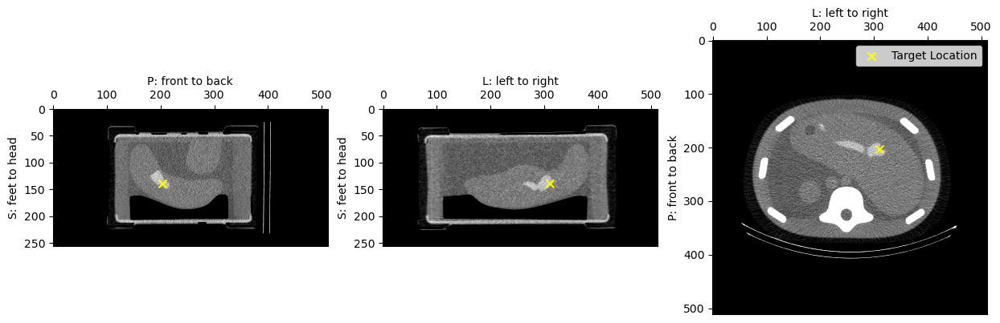

Ultrasound
1.0 0.0


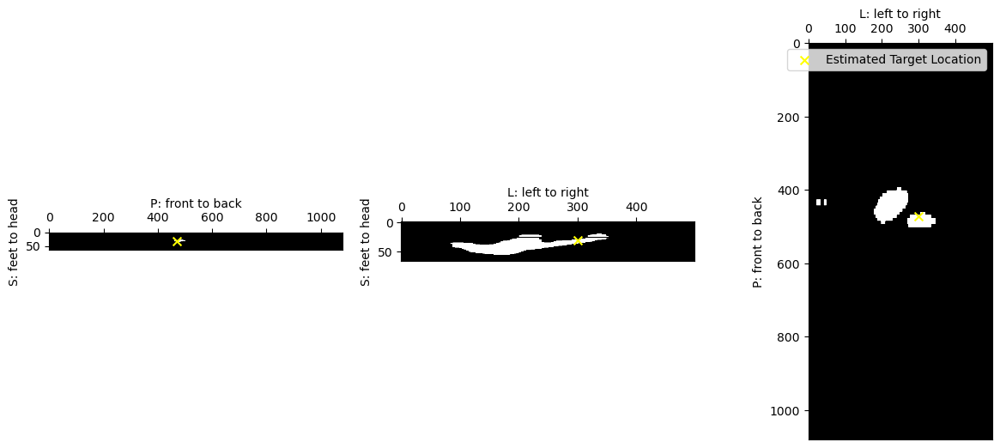

1.0 0.0


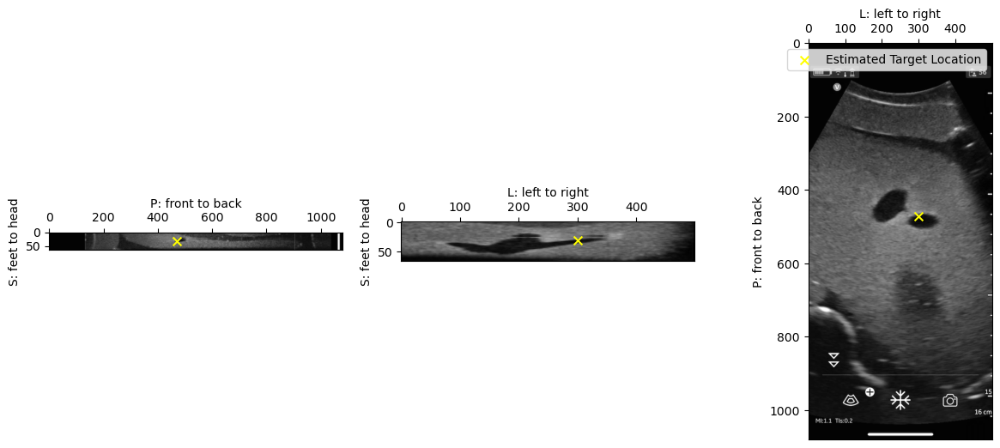

1.0 0.0


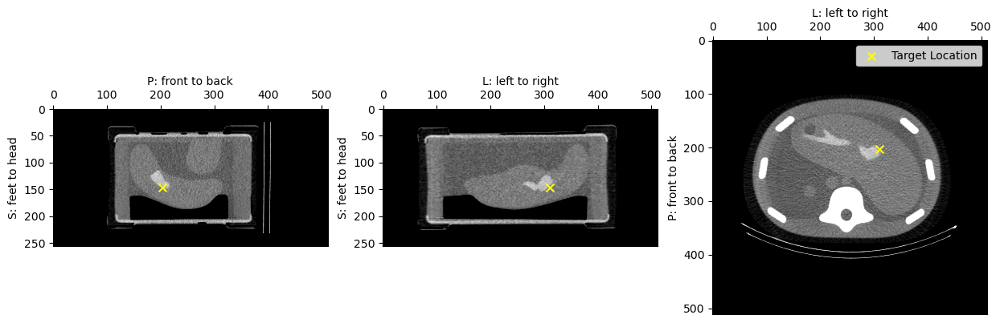

Ultrasound
1.0 0.0


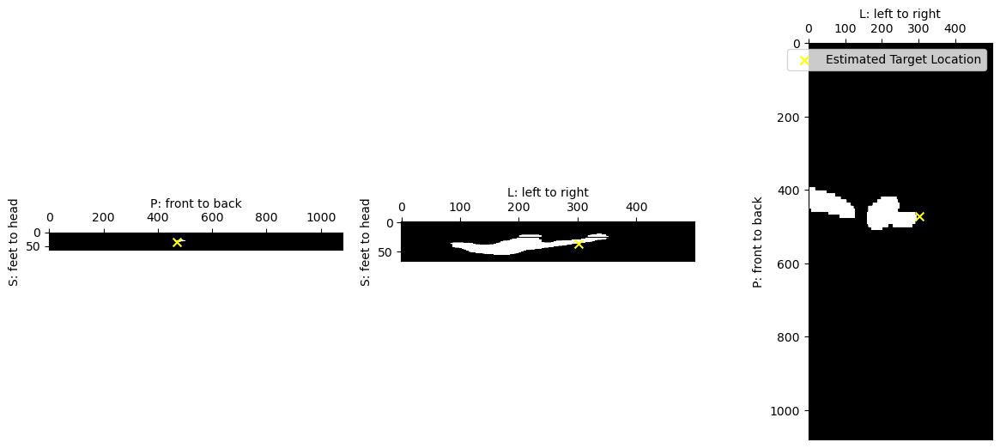

1.0 0.0


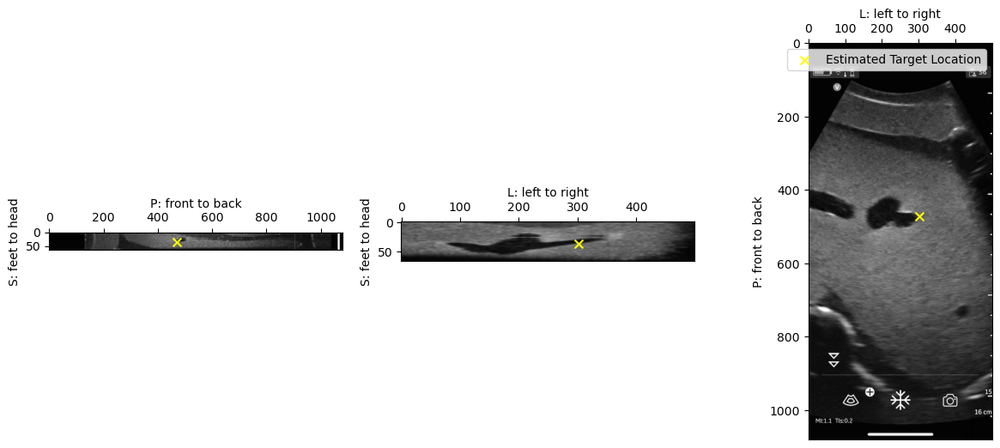

1.0 0.0


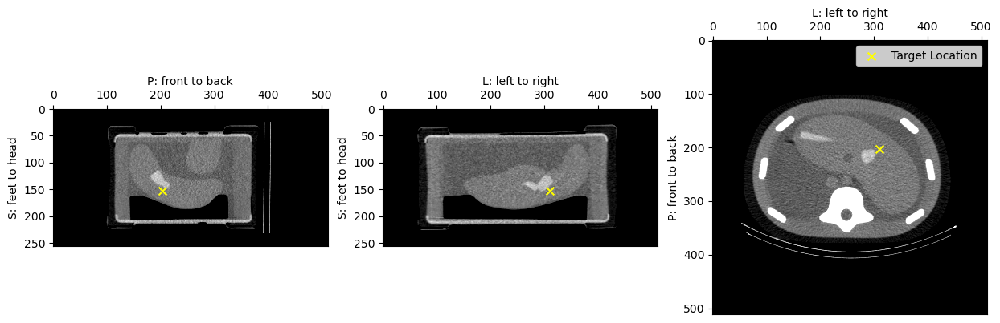

Ultrasound
1.0 0.0


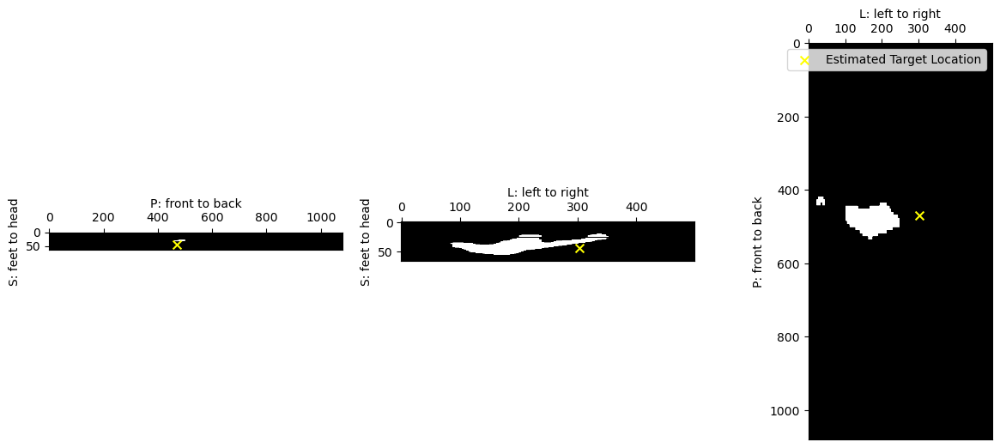

1.0 0.0


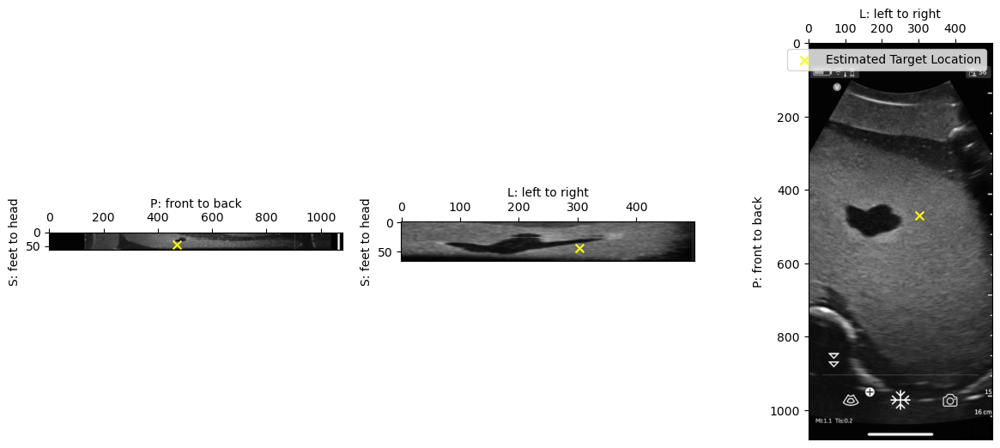

In [59]:
from scripts.Registration3D.registration import visualize_vessel,get_centroid_loc

x_cand = [-80,-40,-20,0,20]
z_cand = [-10,-5,0,5,10]

target_locs = [ get_centroid_loc(original_vessel_ct) + np.array([x,0,z]) for x in x_cand for z in z_cand]

for loc in target_locs:
    pix = original_vessel_ct.TransformPhysicalPointToIndex(loc)
    # visualize_vessel(original_vessel_ct,pix,'Target Location')
    visualize_vessel(body_ct,pix,'Target Location',vmin=0.6,vmax=0.8)

    target_loc_us = CT2US.TransformPoint(loc)
    
    pix = original_vessel_us.TransformPhysicalPointToIndex(target_loc_us)
    print("Ultrasound")
    visualize_vessel(original_vessel_us,pix,'Estimated Target Location')
    visualize_vessel(body_us,pix,'Estimated Target Location',vmin=0.0,vmax=1.0)



In [39]:

def move_xy(ref_pos,rtde_r,rtde_c):
    tcp = rtde_r.getActualTCPPose()
    target_pose = ref_pos[:2]+tcp[2:]
    return rtde_c.moveL(target_pose,0.01,0.1)


In [ ]:
## Sanity check
move_xy(waypoints[0],rtde_r,rtde_c)    
probe_pos_0 = rtde_c.poseTrans(waypoints[0],sc.probe_2_tcp)
us_origin = rtde_c.poseTrans(probe_pos_0,[-original_vessel_us.GetSpacing()[0]*original_vessel_us.GetSize()[0]/(2*1000),0,0,0,0,0])
move_xy(us_origin,rtde_r,rtde_c)

True

In [61]:
## Move to target locations and take ultrasound images
observations = []

for target_loc_ct in target_locs:
    target_loc_us = CT2US.TransformPoint(target_loc_ct)
    tx = -target_loc_us[-1]/1000
    ty = -target_loc_us[0]/1000
    us_x = us_origin[0]
    us_y = us_origin[1]
    target_loc_robot = [us_x+tx,us_y+ty,0,0,0,0]
    move_xy(target_loc_robot,rtde_r,rtde_c)
    ret,frame = ultrasound_vid.read()
    observations.append(frame)
    time.sleep(0.1)


In [64]:
# Save the observations
with open('us_observations.pkl','wb') as fp:
    pkl.dump({'frame':observations,'CT_target_locs':target_locs,'CT_image':original_vessel_ct,'Observation Origin':get_centroid_loc(original_vessel_ct)},fp)

1.0 0.0


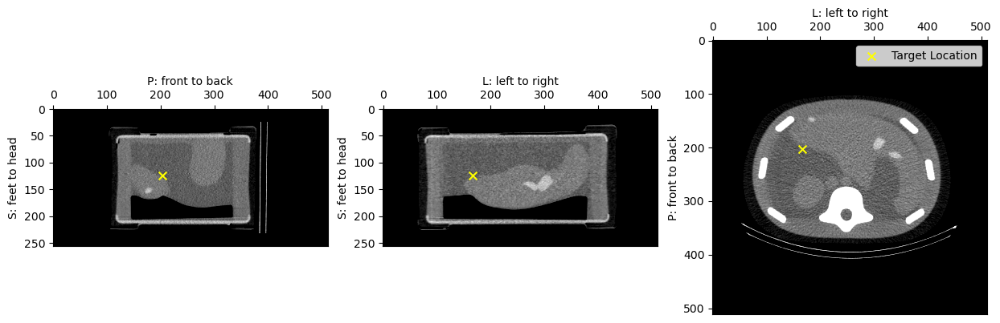

1.0 0.0


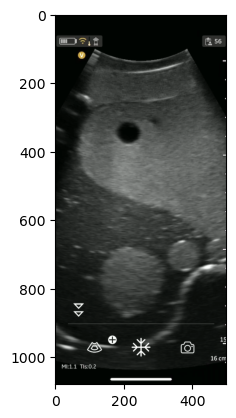

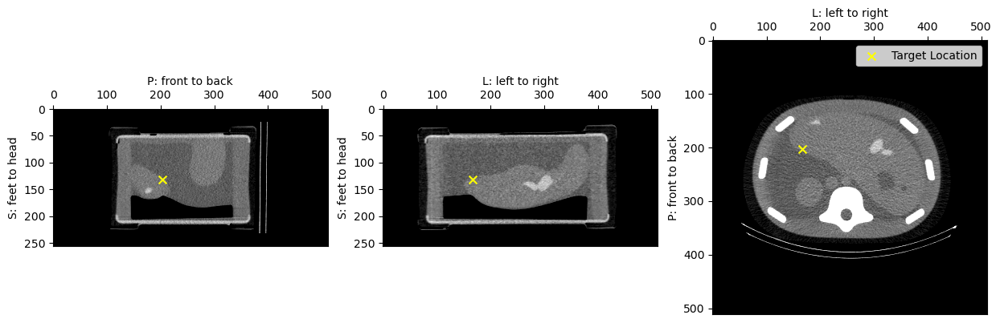

1.0 0.0


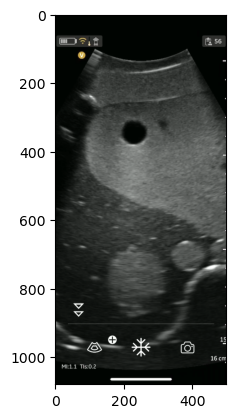

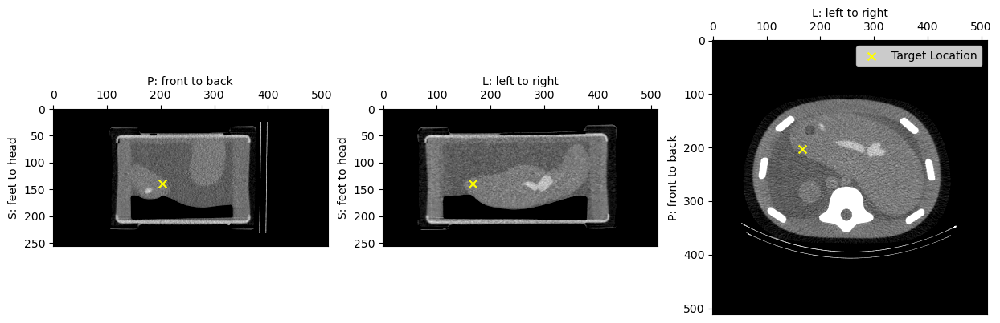

1.0 0.0


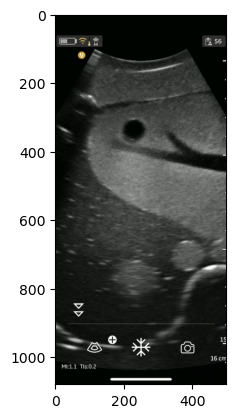

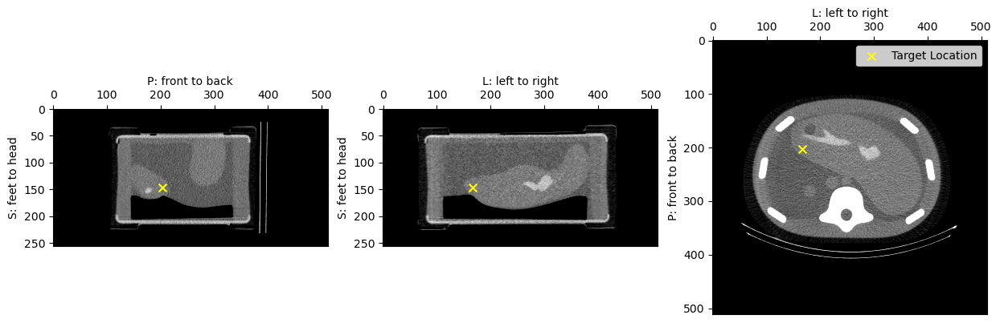

1.0 0.0


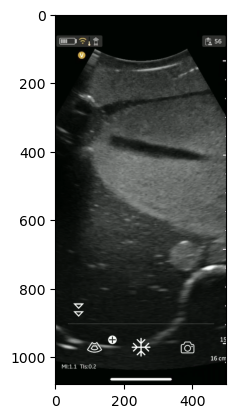

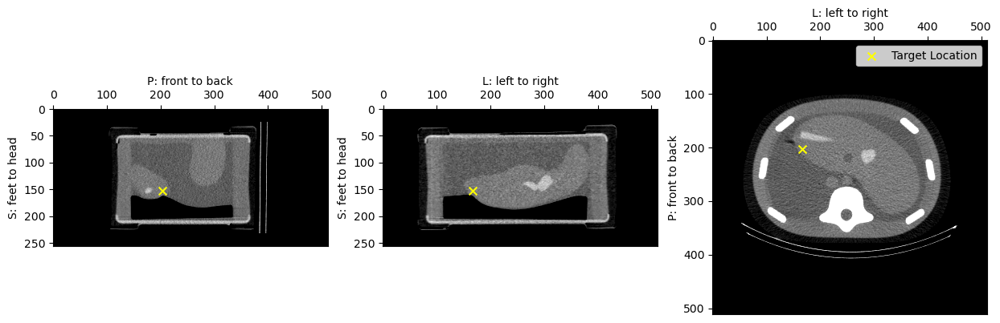

1.0 0.0


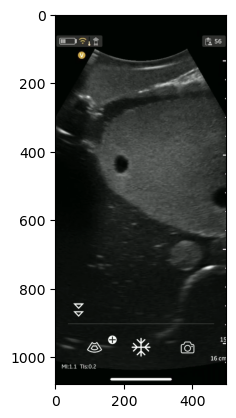

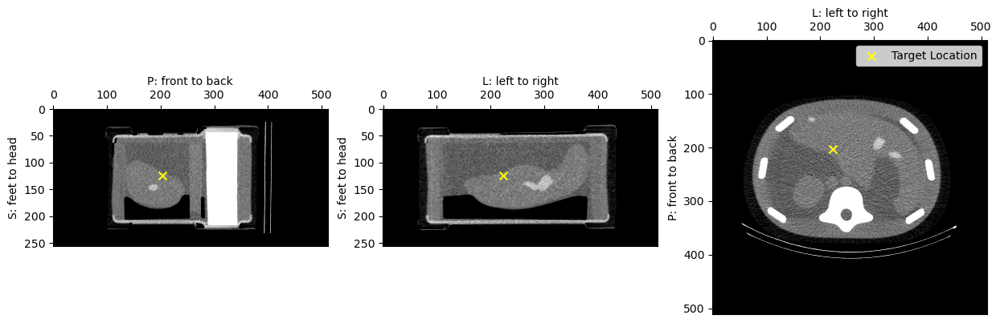

1.0 0.0


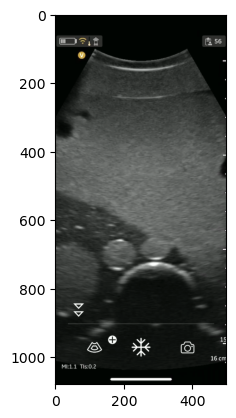

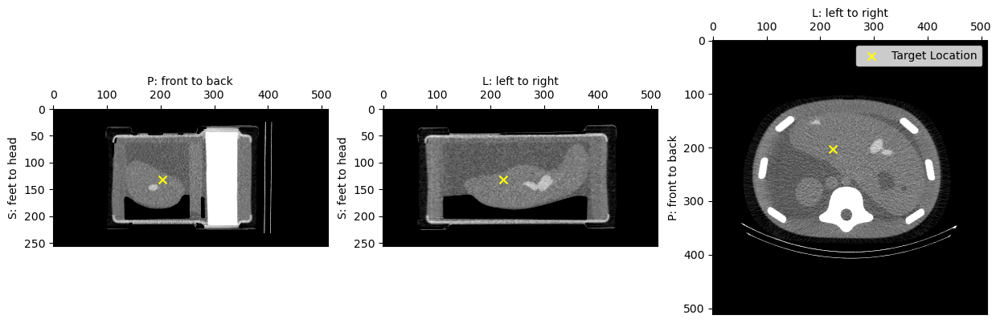

1.0 0.0


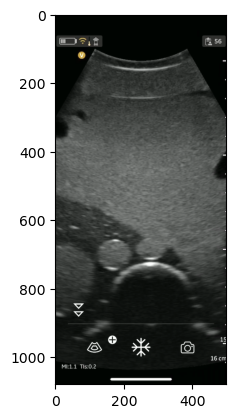

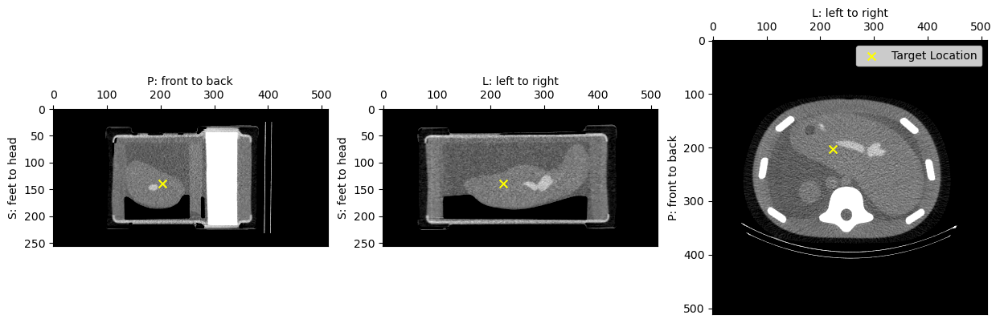

1.0 0.0


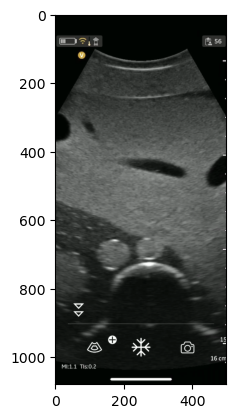

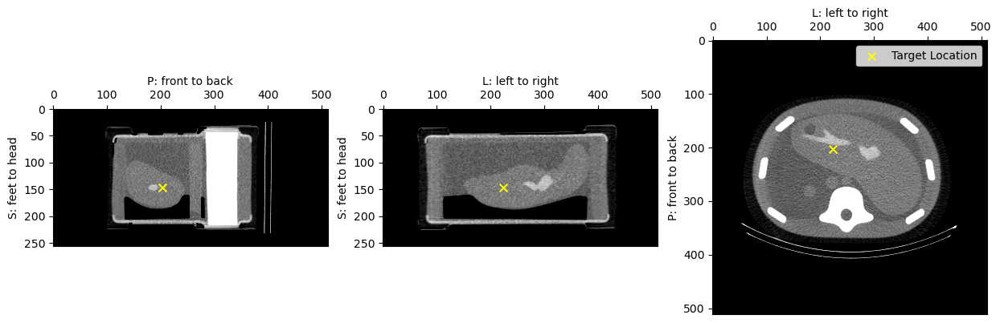

1.0 0.0


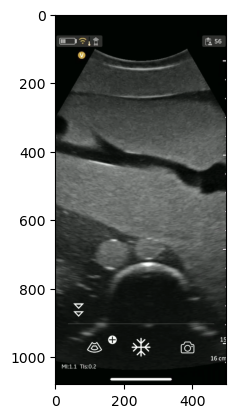

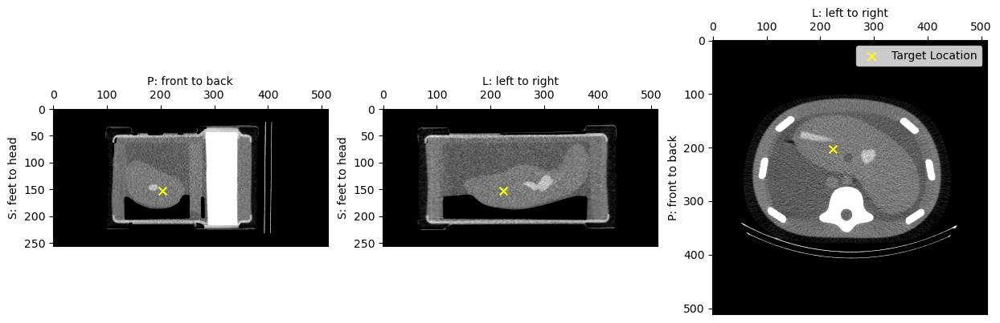

1.0 0.0


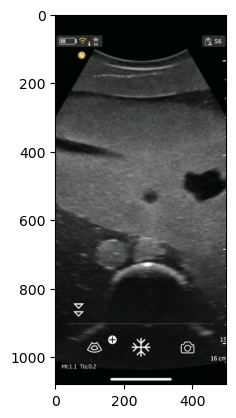

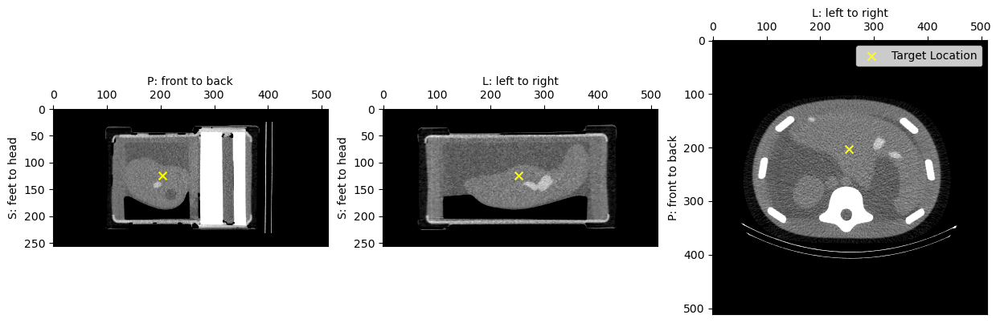

1.0 0.0


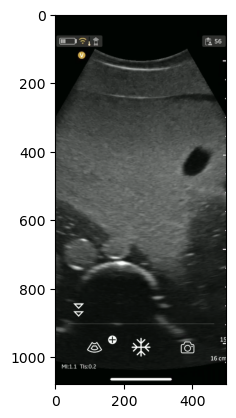

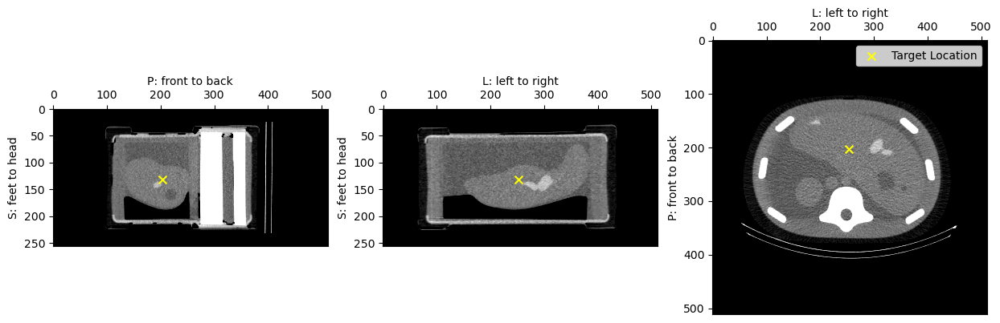

1.0 0.0


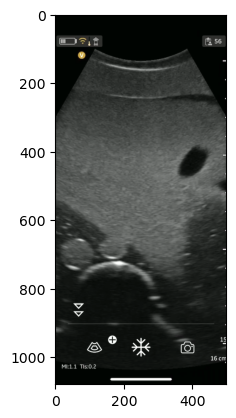

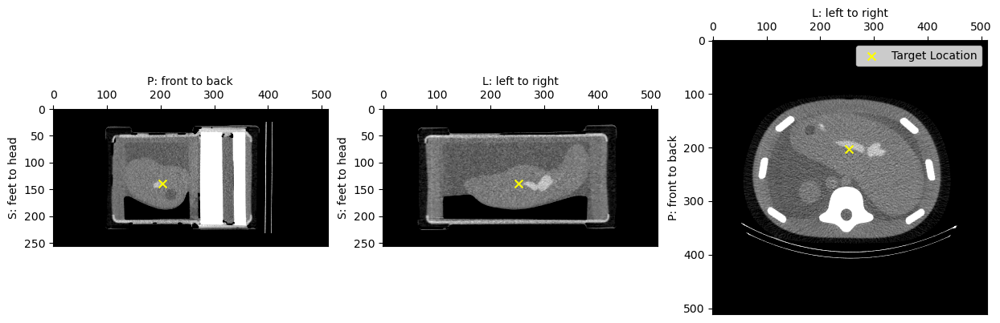

1.0 0.0


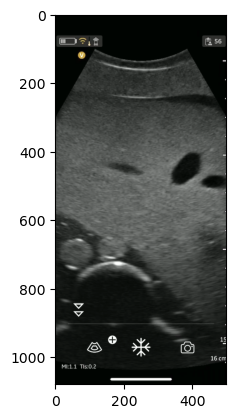

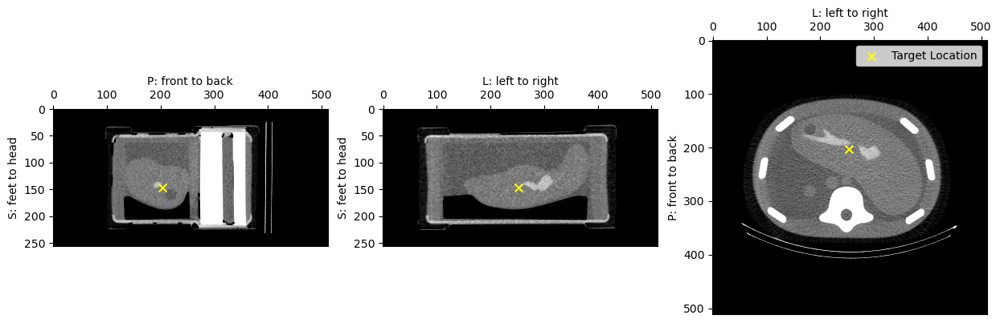

1.0 0.0


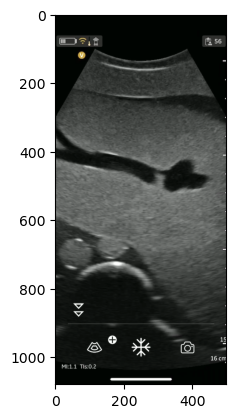

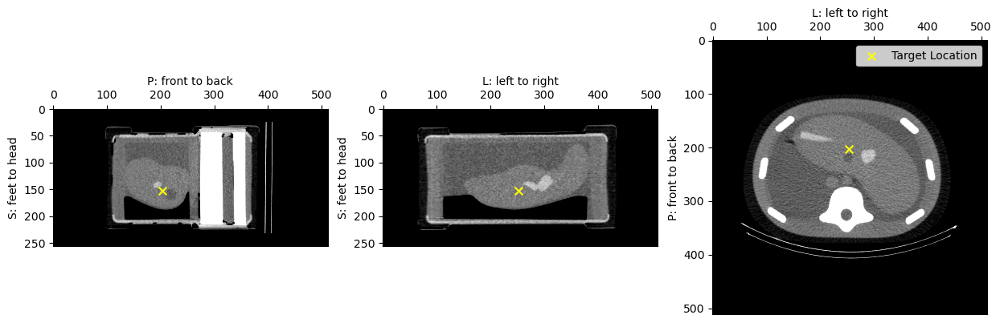

1.0 0.0


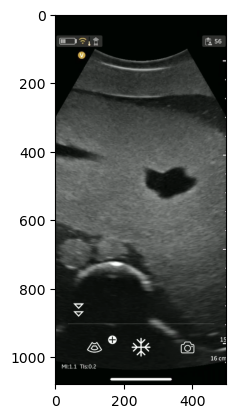

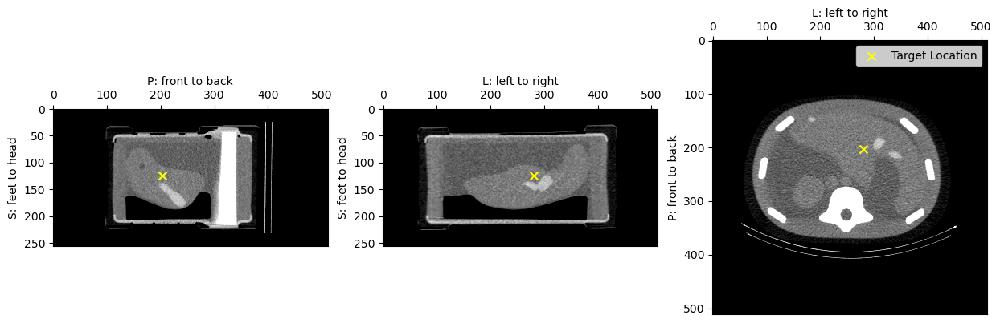

1.0 0.0


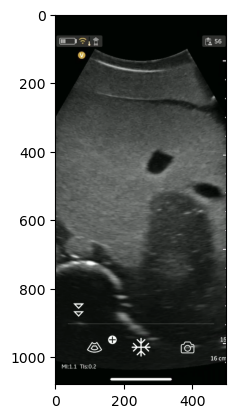

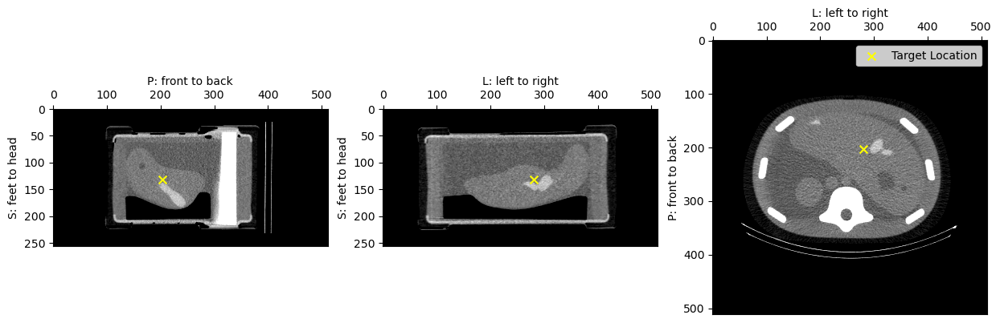

1.0 0.0


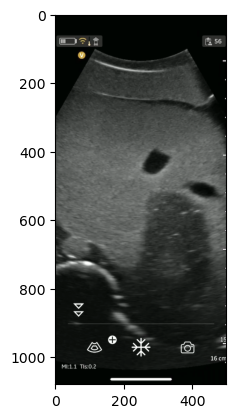

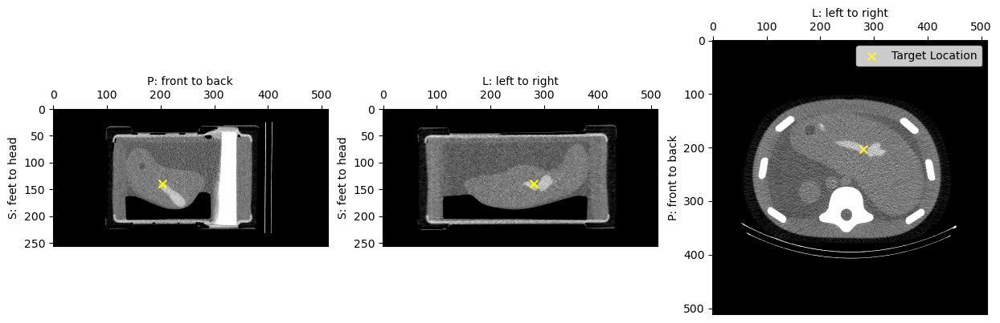

1.0 0.0


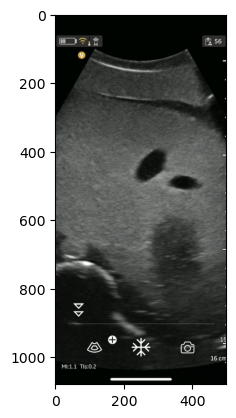

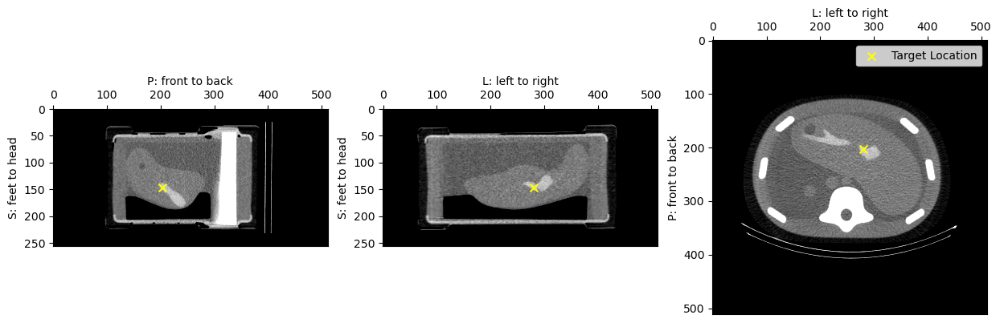

1.0 0.0


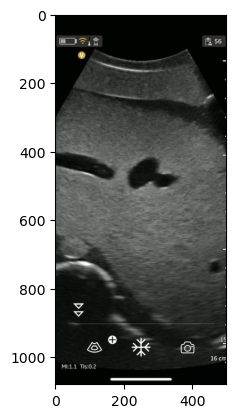

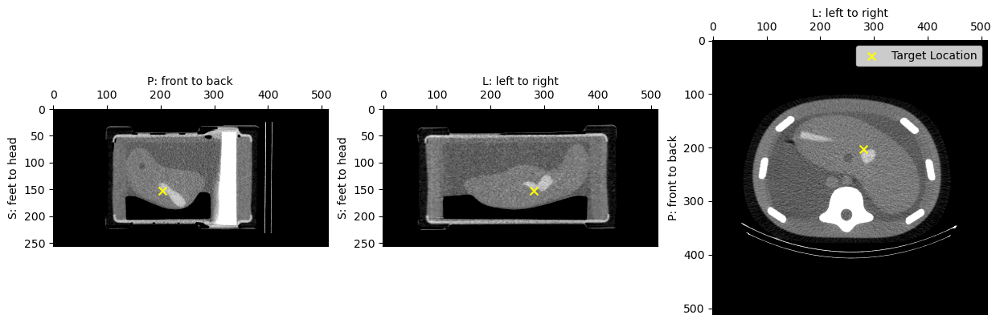

1.0 0.0


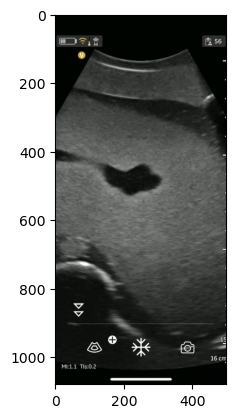

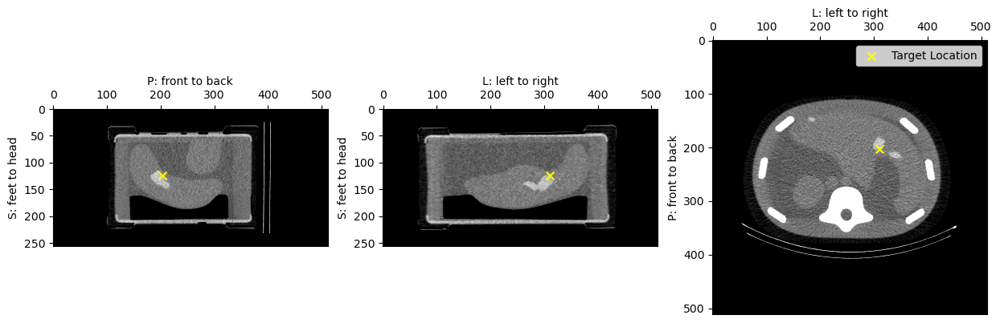

1.0 0.0


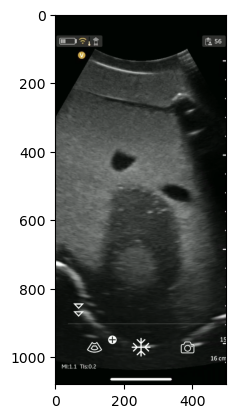

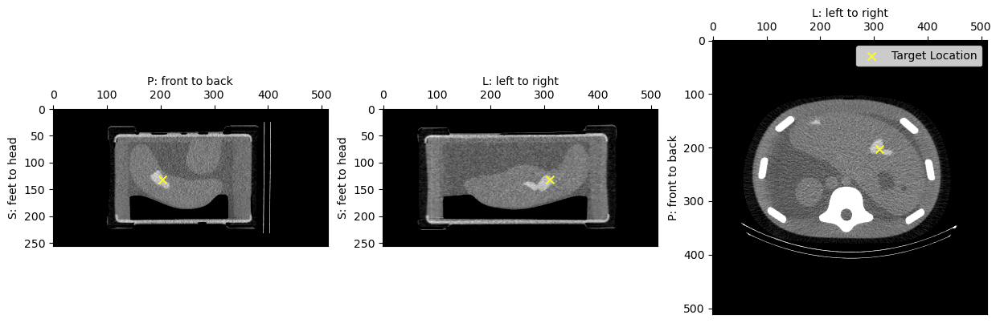

1.0 0.0


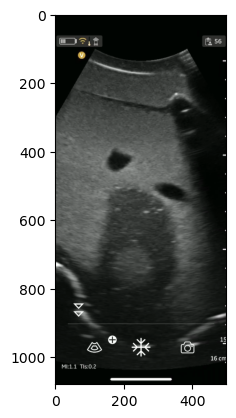

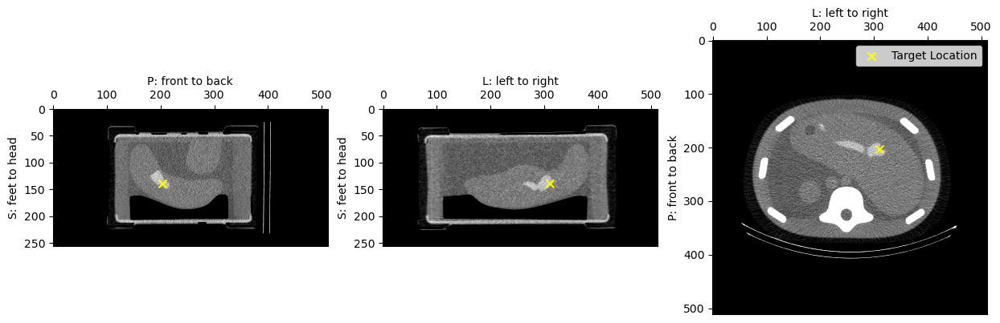

1.0 0.0


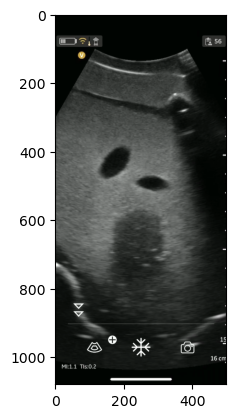

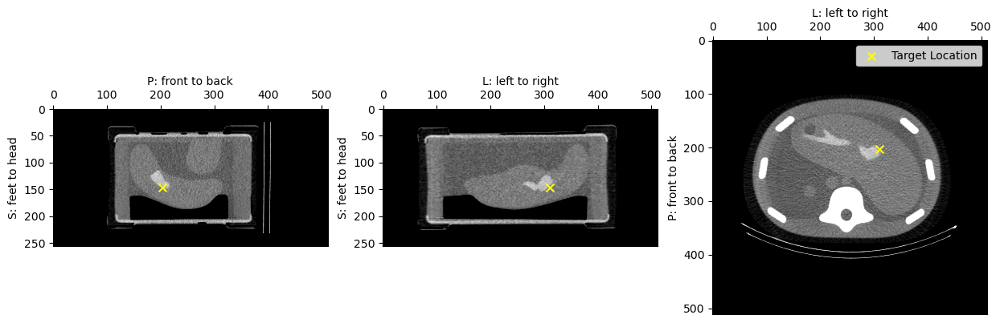

1.0 0.0


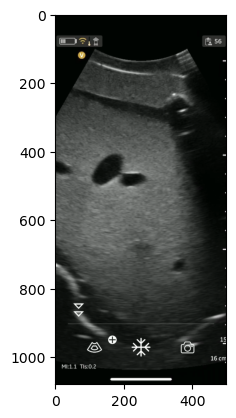

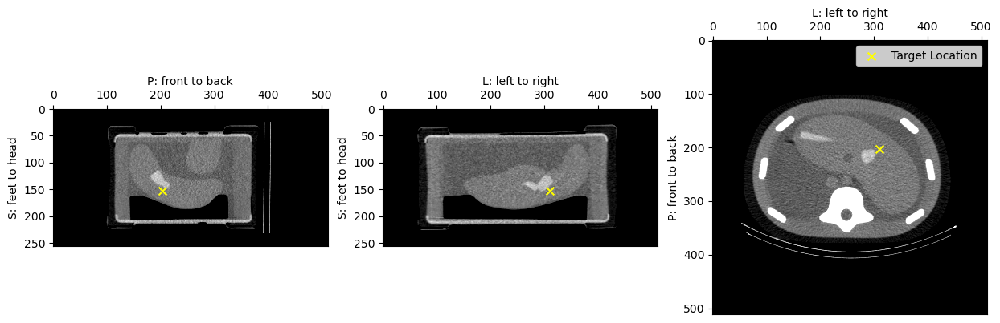

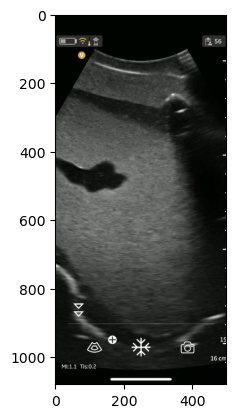

In [66]:

for i in range(25):
    loc = target_locs[i]

    pix = original_vessel_ct.TransformPhysicalPointToIndex(loc)
    # visualize_vessel(original_vessel_ct,pix,'Target Location')
    visualize_vessel(body_ct,pix,'Target Location',vmin=0.6,vmax=0.8)

    o = observations[i]
    plt.imshow(o,cmap = 'gray')

In [34]:
pipeline.stop()

In [35]:
ultrasound_vid.release()

# Clean up

In [67]:
ultrasound_vid.release()
pipeline.stop()

# Useful Scripts

In [4]:
# Script for saving default pose
with open('../../config/default_pose.yaml','w') as f:
    yaml.safe_dump({'default_pose':rtde_r.getActualTCPPose()},f)